<a href="https://colab.research.google.com/github/samteotia30/demo/blob/main/energ%20forcasting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

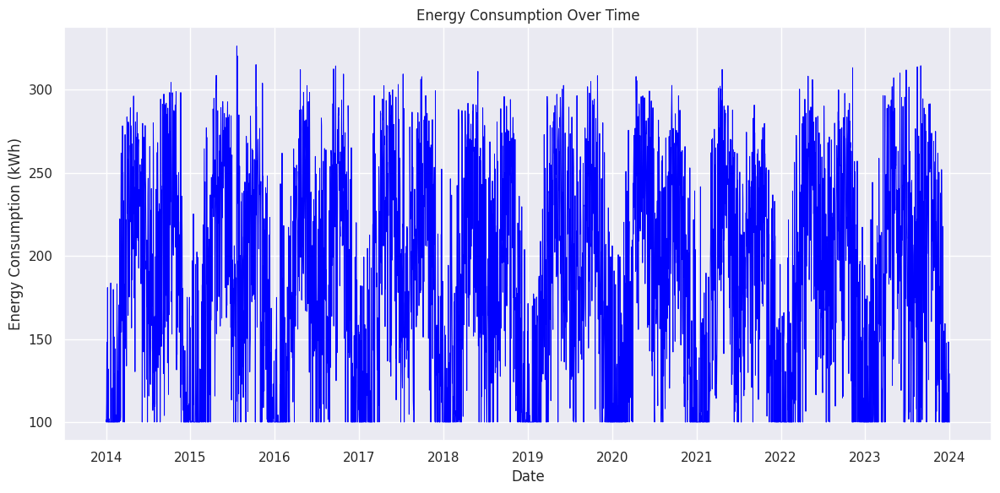

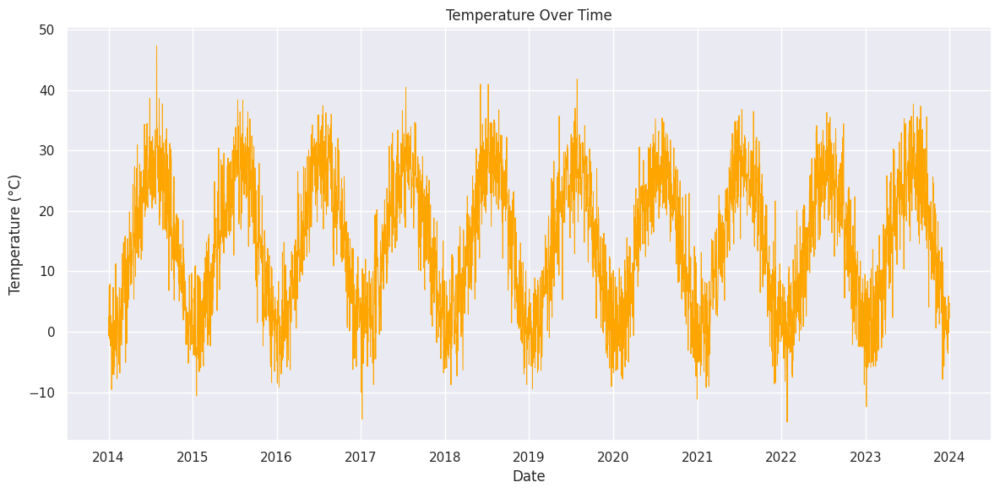

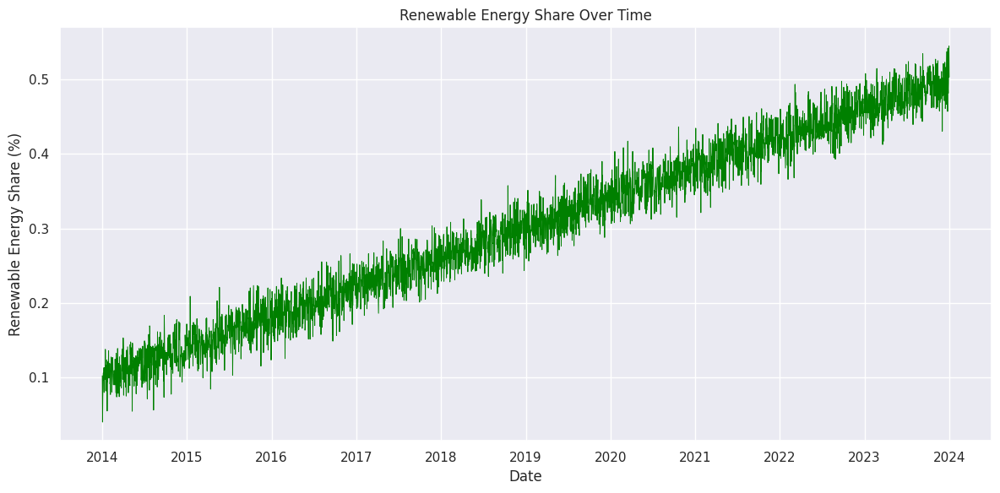

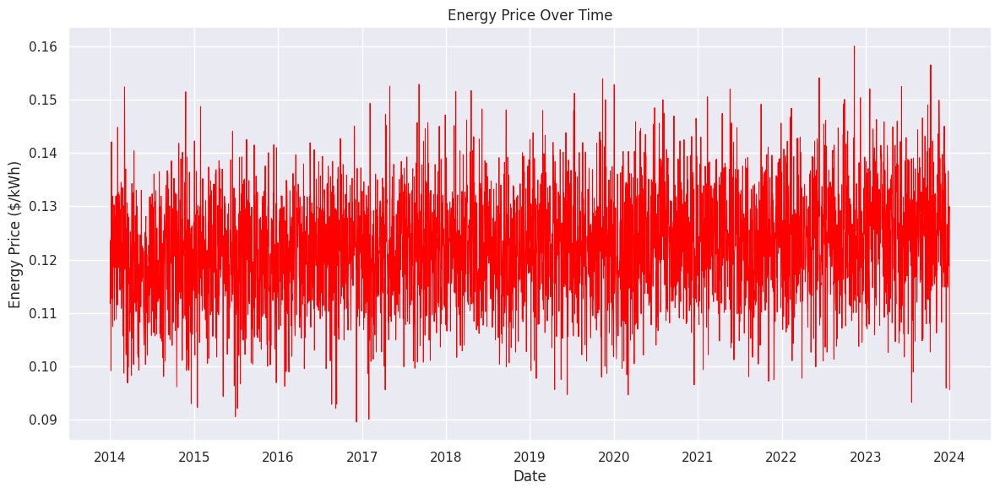

In [3]:
!pip install seaborn
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Load the dataset
data = pd.read_csv("/content/synthetic_energy_forecasting.csv")  # Replace with your file path

# Convert 'Date' column to datetime for plotting
data['Date'] = pd.to_datetime(data['Date'])

# Set up the plotting style using Seaborn
# plt.style.use('seaborn-darkgrid') # This line is replaced with the following
sns.set_theme(style="darkgrid") # Use Seaborn to set the 'darkgrid' style


# Plot Energy Consumption over Time
plt.figure(figsize=(12, 6))
plt.plot(data['Date'], data['EnergyConsumption'], color='blue', linewidth=0.7)
plt.title('Energy Consumption Over Time')
plt.xlabel('Date')
plt.ylabel('Energy Consumption (kWh)')
plt.tight_layout()
plt.show()

# Plot Temperature over Time
plt.figure(figsize=(12, 6))
plt.plot(data['Date'], data['Temperature'], color='orange', linewidth=0.7)
plt.title('Temperature Over Time')
plt.xlabel('Date')
plt.ylabel('Temperature (\u00b0C)')
plt.tight_layout()
plt.show()

# Plot Renewable Energy Share over Time
plt.figure(figsize=(12, 6))
plt.plot(data['Date'], data['RenewableShare'], color='green', linewidth=0.7)
plt.title('Renewable Energy Share Over Time')
plt.xlabel('Date')
plt.ylabel('Renewable Energy Share (%)')
plt.tight_layout()
plt.show()

# Plot Energy Prices over Time
plt.figure(figsize=(12, 6))
plt.plot(data['Date'], data['EnergyPrice'], color='red', linewidth=0.7)
plt.title('Energy Price Over Time')
plt.xlabel('Date')
plt.ylabel('Energy Price ($/kWh)')
plt.tight_layout()
plt.show()

Explained Variance Ratio: [0.35664915 0.29205344]


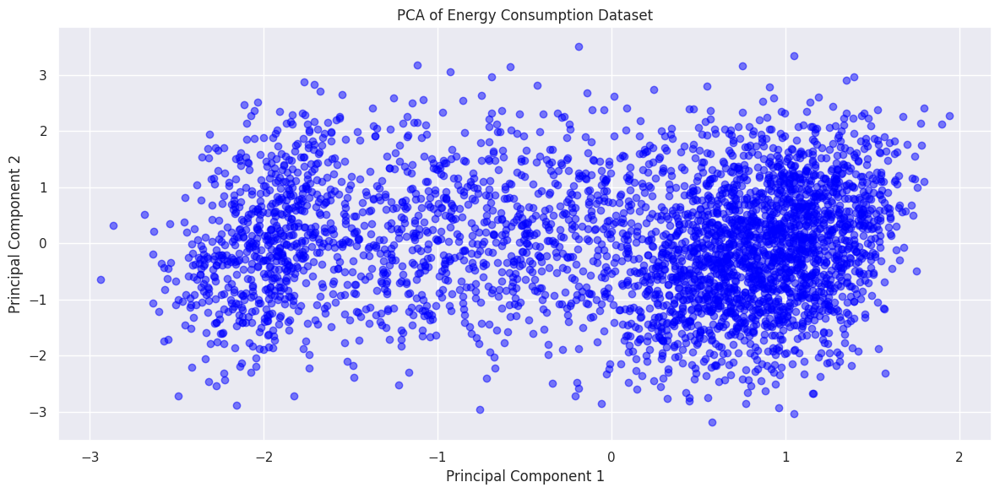

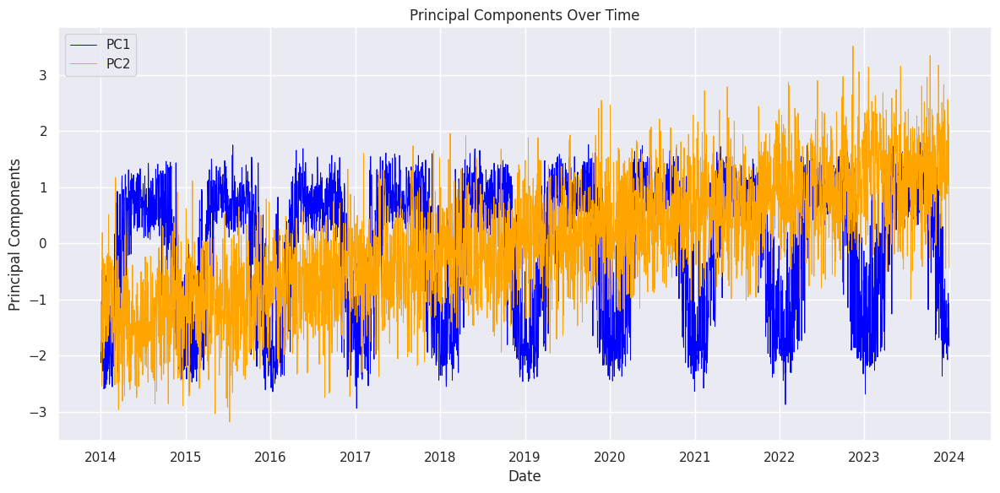

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Load the dataset
data = pd.read_csv("synthetic_energy_forecasting.csv")  # Replace with your file path

# Convert 'Date' column to datetime for plotting
data['Date'] = pd.to_datetime(data['Date'])

# Select relevant numerical features for PCA
features = ['EnergyConsumption', 'Temperature', 'RenewableShare', 'EnergyPrice']
X = data[features]

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Apply PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(X_scaled)

# Create a DataFrame for the principal components
pca_df = pd.DataFrame(data=principal_components, columns=['PC1', 'PC2'])

# Add Date for visualization
pca_df['Date'] = data['Date']

# Explained variance ratio
explained_variance = pca.explained_variance_ratio_
print("Explained Variance Ratio:", explained_variance)

# Plot the principal components
plt.figure(figsize=(12, 6))
plt.scatter(pca_df['PC1'], pca_df['PC2'], c='blue', alpha=0.5)
plt.title('PCA of Energy Consumption Dataset')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot PC1 and PC2 over time
plt.figure(figsize=(12, 6))
plt.plot(pca_df['Date'], pca_df['PC1'], label='PC1', color='blue', linewidth=0.7)
plt.plot(pca_df['Date'], pca_df['PC2'], label='PC2', color='orange', linewidth=0.7)
plt.title('Principal Components Over Time')
plt.xlabel('Date')
plt.ylabel('Principal Components')
plt.legend()
plt.tight_layout()
plt.show()


Dataset Information:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3653 entries, 0 to 3652
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Date               3653 non-null   datetime64[ns]
 1   Year               3653 non-null   int64         
 2   Month              3653 non-null   int64         
 3   Day                3653 non-null   int64         
 4   DayOfWeek          3653 non-null   int64         
 5   IsHoliday          3653 non-null   int64         
 6   Temperature        3653 non-null   float64       
 7   EnergyPrice        3653 non-null   float64       
 8   EnergyConsumption  3653 non-null   float64       
 9   RenewableShare     3653 non-null   float64       
dtypes: datetime64[ns](1), float64(4), int64(5)
memory usage: 285.5 KB
None

Summary Statistics:

                      Date         Year        Month          Day  \
count                 3653  3653.000000  365

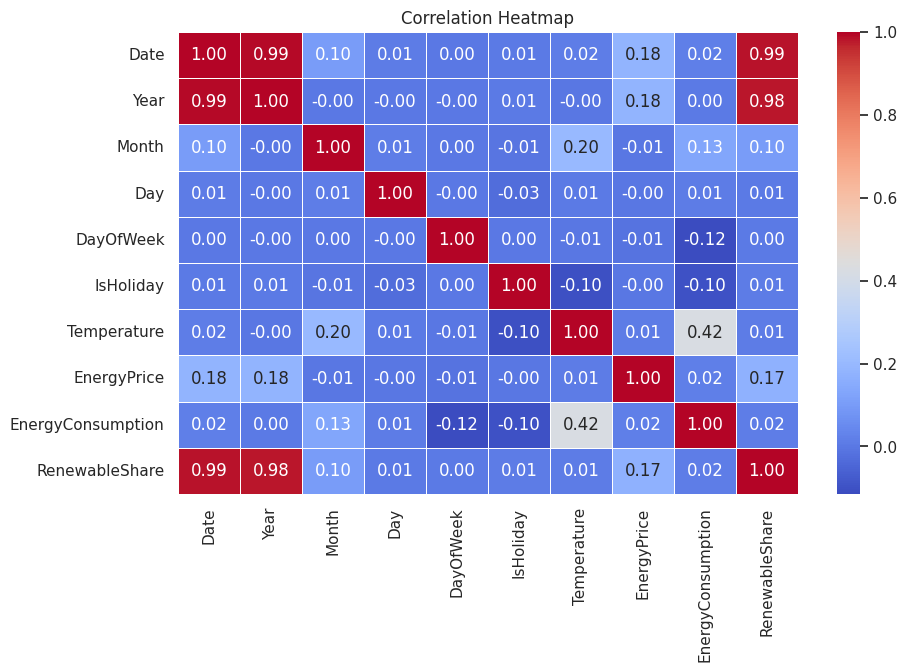

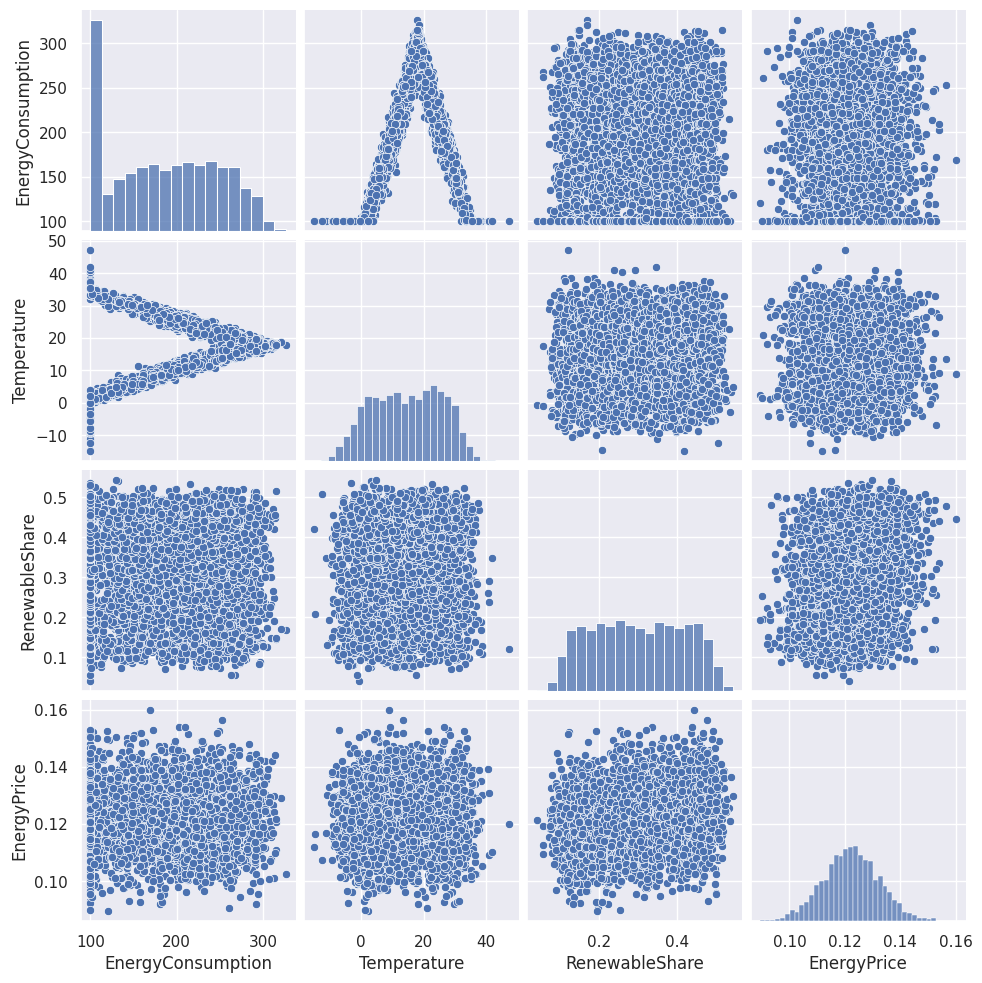

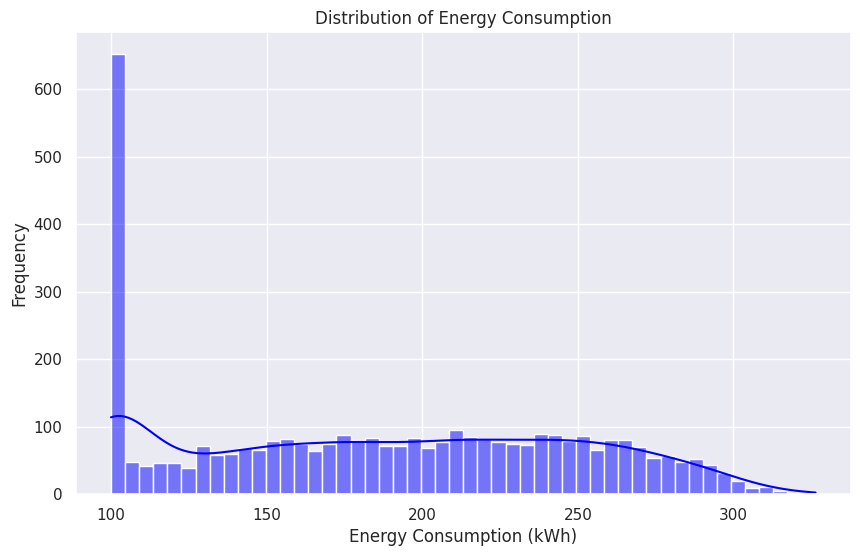

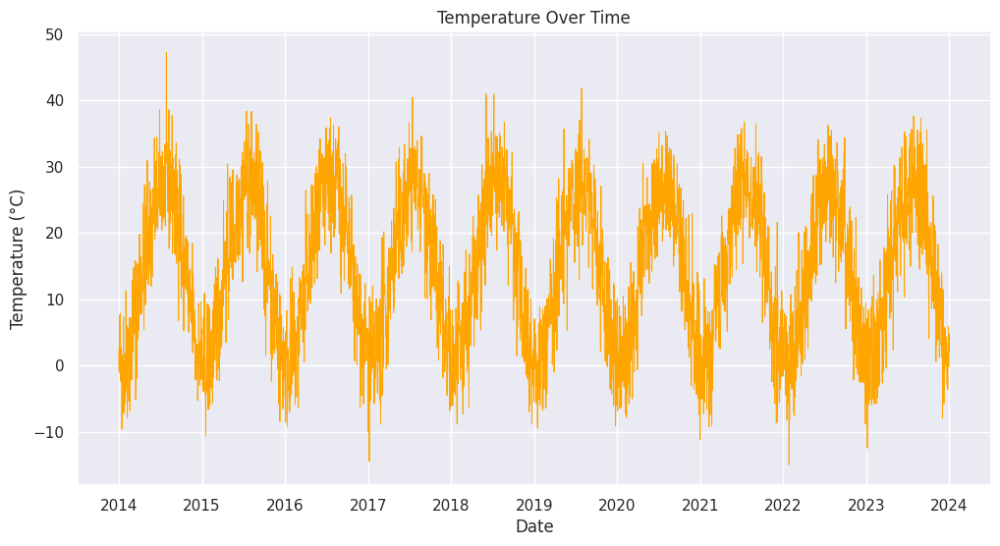

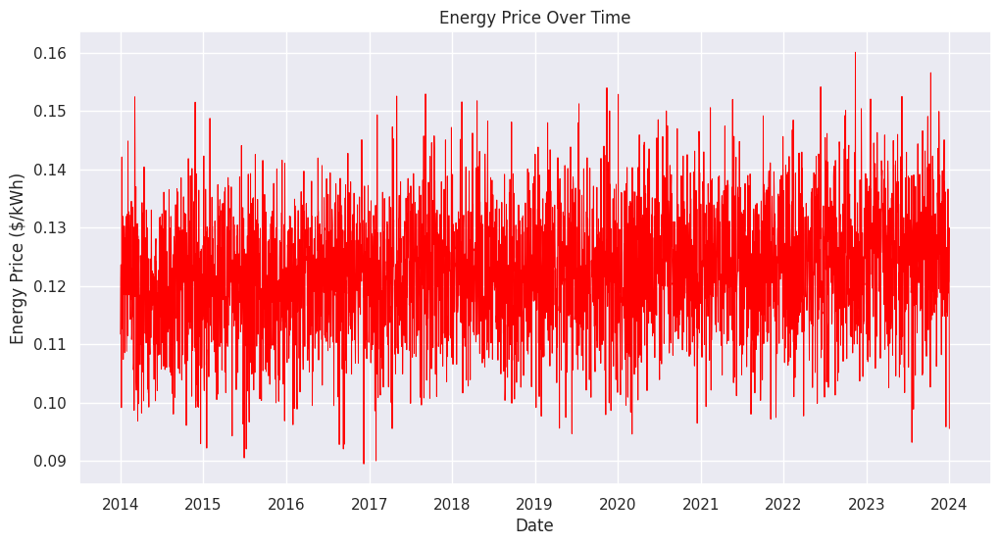

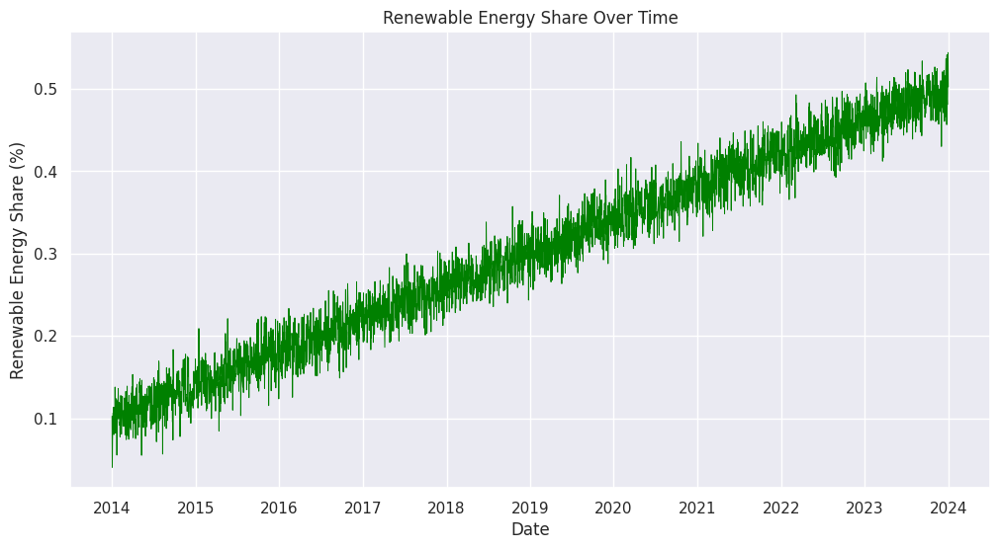

<ipython-input-5-63ebabf2468e>:68: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=data['Month'], y=data['EnergyConsumption'], palette='Blues')


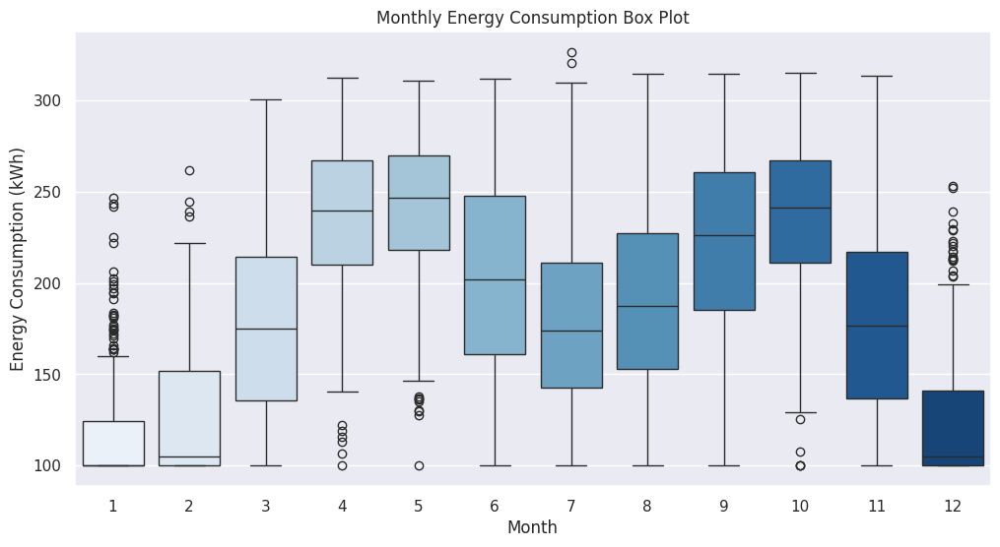

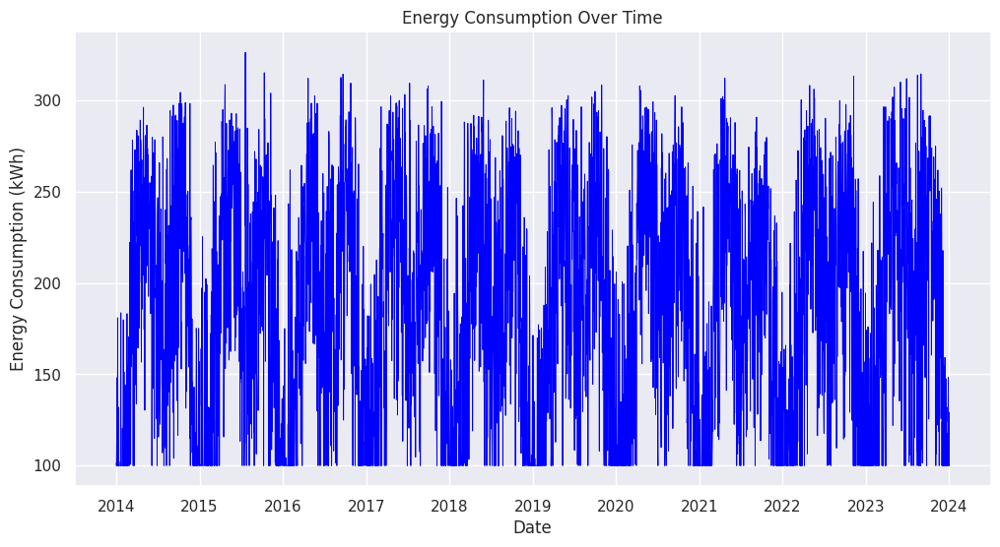

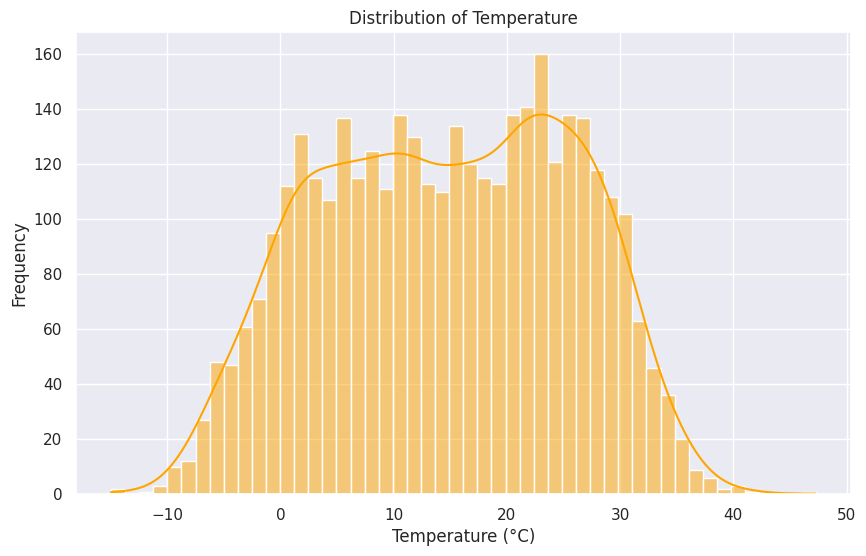

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
data = pd.read_csv("synthetic_energy_forecasting.csv")  # Replace with your file path

# Convert 'Date' column to datetime
data['Date'] = pd.to_datetime(data['Date'])

# Display basic information about the dataset
print("Dataset Information:\n")
print(data.info())

# Display summary statistics
print("\nSummary Statistics:\n")
print(data.describe())

# Check for missing values
print("\nMissing Values:\n")
print(data.isnull().sum())

# Correlation Heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

# Pair Plot for Numerical Features
numerical_features = ['EnergyConsumption', 'Temperature', 'RenewableShare', 'EnergyPrice']
sns.pairplot(data[numerical_features])
plt.show()

# Plot Distribution of Energy Consumption
plt.figure(figsize=(10, 6))
sns.histplot(data['EnergyConsumption'], bins=50, kde=True, color='blue')
plt.title('Distribution of Energy Consumption')
plt.xlabel('Energy Consumption (kWh)')
plt.ylabel('Frequency')
plt.show()

# Plot Temperature Over Time
plt.figure(figsize=(12, 6))
plt.plot(data['Date'], data['Temperature'], color='orange', linewidth=0.7)
plt.title('Temperature Over Time')
plt.xlabel('Date')
plt.ylabel('Temperature (°C)')
plt.show()

# Plot Energy Price Over Time
plt.figure(figsize=(12, 6))
plt.plot(data['Date'], data['EnergyPrice'], color='red', linewidth=0.7)
plt.title('Energy Price Over Time')
plt.xlabel('Date')
plt.ylabel('Energy Price ($/kWh)')
plt.show()

# Plot Renewable Energy Share Over Time
plt.figure(figsize=(12, 6))
plt.plot(data['Date'], data['RenewableShare'], color='green', linewidth=0.7)
plt.title('Renewable Energy Share Over Time')
plt.xlabel('Date')
plt.ylabel('Renewable Energy Share (%)')
plt.show()

# Box Plot of Energy Consumption by Month
plt.figure(figsize=(12, 6))
sns.boxplot(x=data['Month'], y=data['EnergyConsumption'], palette='Blues')
plt.title('Monthly Energy Consumption Box Plot')
plt.xlabel('Month')
plt.ylabel('Energy Consumption (kWh)')
plt.show()

# Line Plot of Energy Consumption Over Time
plt.figure(figsize=(12, 6))
plt.plot(data['Date'], data['EnergyConsumption'], color='blue', linewidth=0.7)
plt.title('Energy Consumption Over Time')
plt.xlabel('Date')
plt.ylabel('Energy Consumption (kWh)')
plt.show()

# Distribution of Temperature
plt.figure(figsize=(10, 6))
sns.histplot(data['Temperature'], bins=50, kde=True, color='orange')
plt.title('Distribution of Temperature')
plt.xlabel('Temperature (°C)')
plt.ylabel('Frequency')
plt.show()


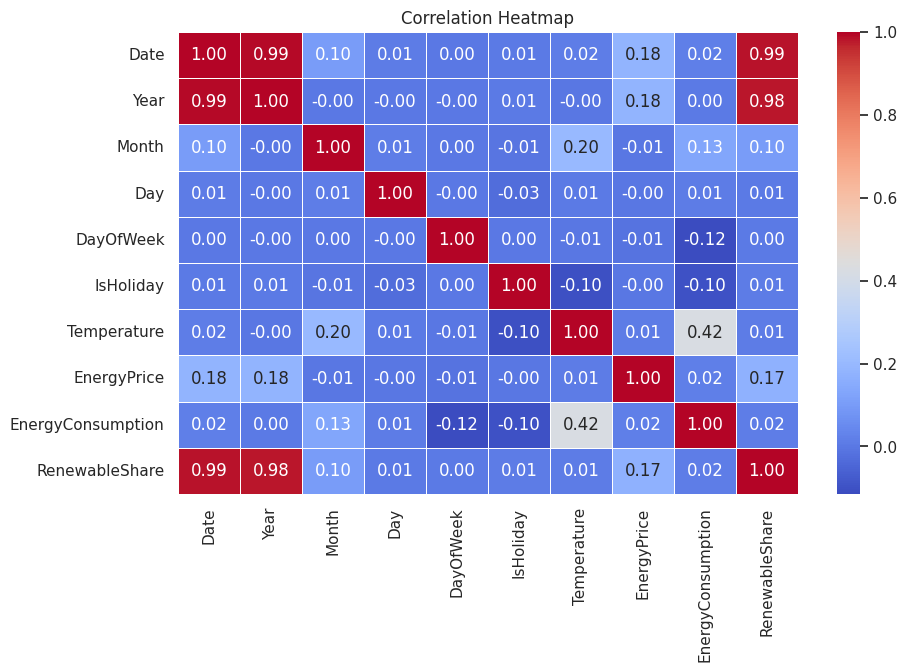

In [6]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
data = pd.read_csv("synthetic_energy_forecasting.csv")  # Replace with your file path

# Convert 'Date' column to datetime
data['Date'] = pd.to_datetime(data['Date'])

# Correlation Heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()


Basic Statistics:

              Year        Month          Day    DayOfWeek    IsHoliday  \
count  3653.000000  3653.000000  3653.000000  3653.000000  3653.000000   
mean   2018.501232     6.522037    15.723789     3.000547     0.005749   
std       2.873341     3.449744     8.802698     2.000274     0.075612   
min    2014.000000     1.000000     1.000000     0.000000     0.000000   
25%    2016.000000     4.000000     8.000000     1.000000     0.000000   
50%    2019.000000     7.000000    16.000000     3.000000     0.000000   
75%    2021.000000    10.000000    23.000000     5.000000     0.000000   
max    2024.000000    12.000000    31.000000     6.000000     1.000000   

       Temperature  EnergyPrice  EnergyConsumption  RenewableShare  
count  3653.000000  3653.000000        3653.000000     3653.000000  
mean     14.599063     0.122316         185.999835        0.300366  
std      10.981373     0.010290          62.036386        0.117407  
min     -14.955680     0.089496       

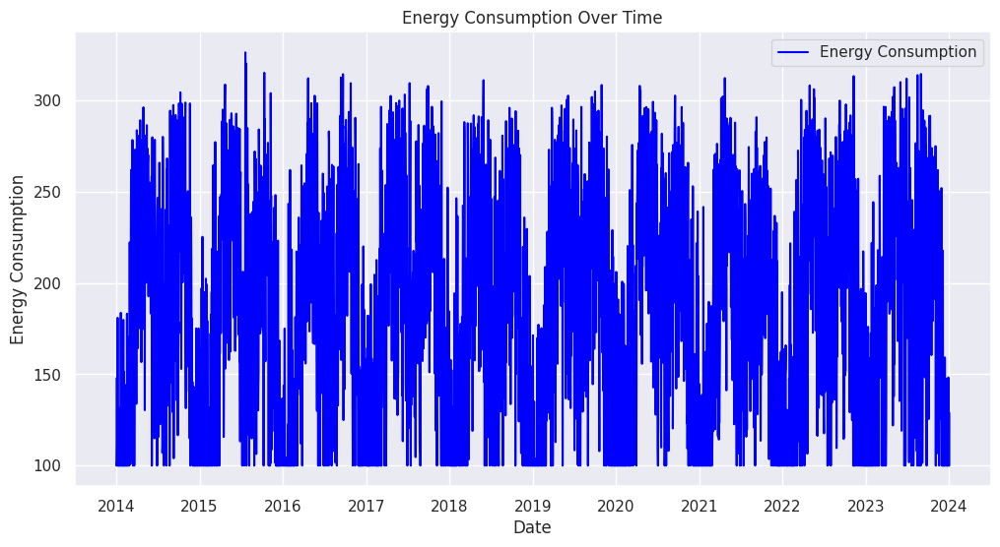

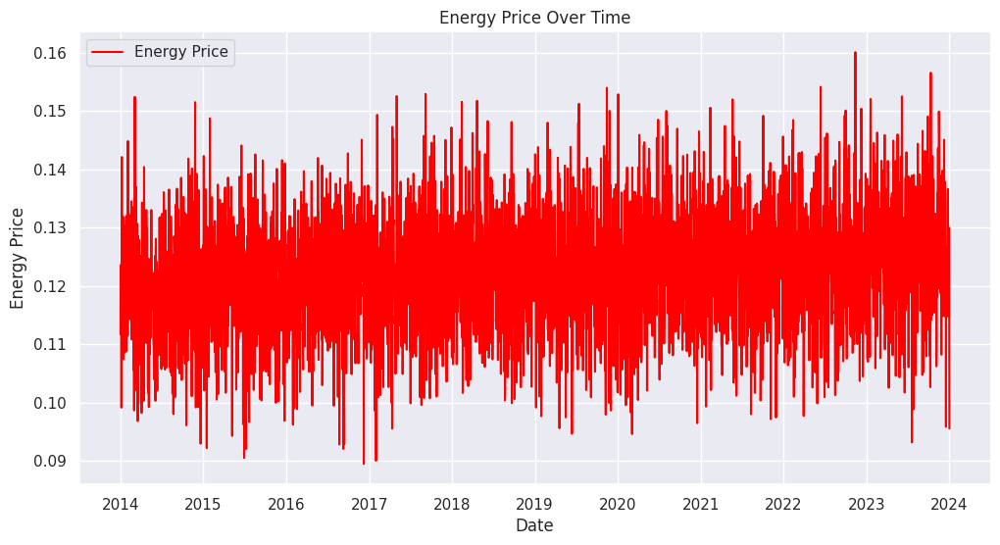

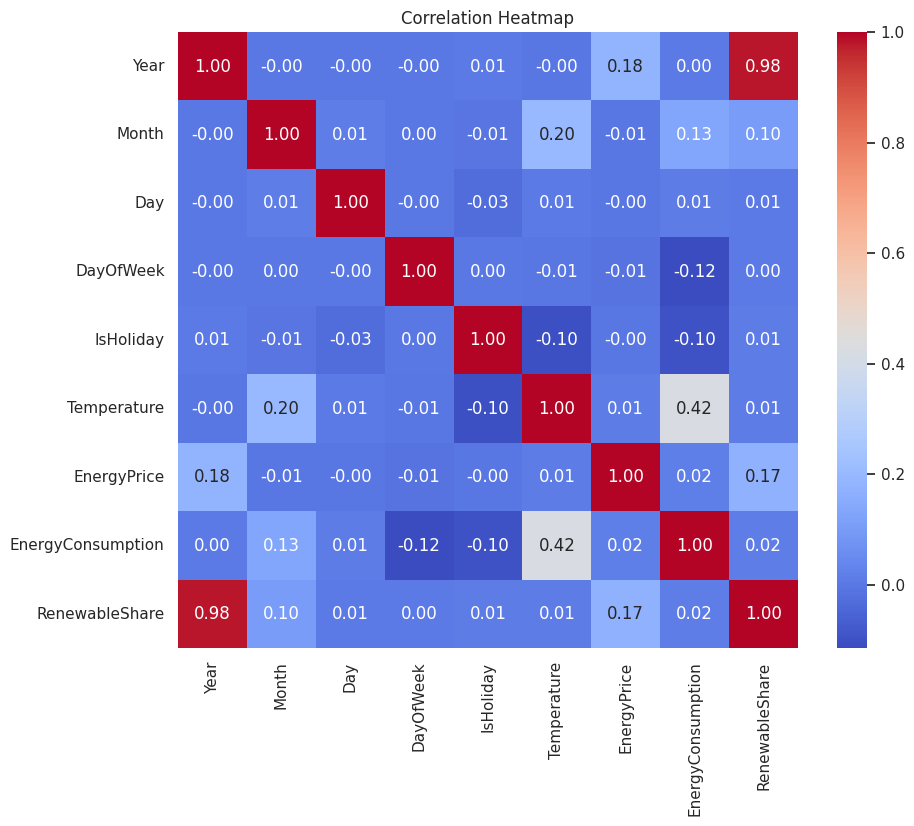

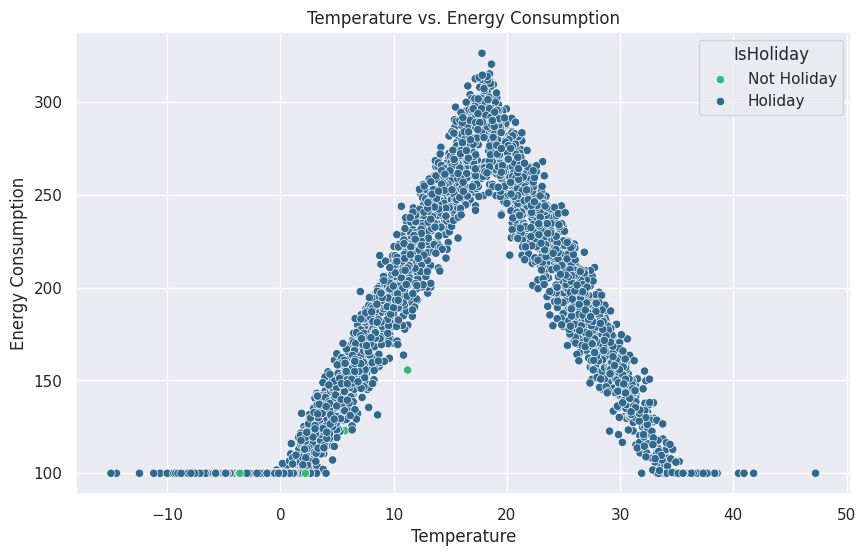

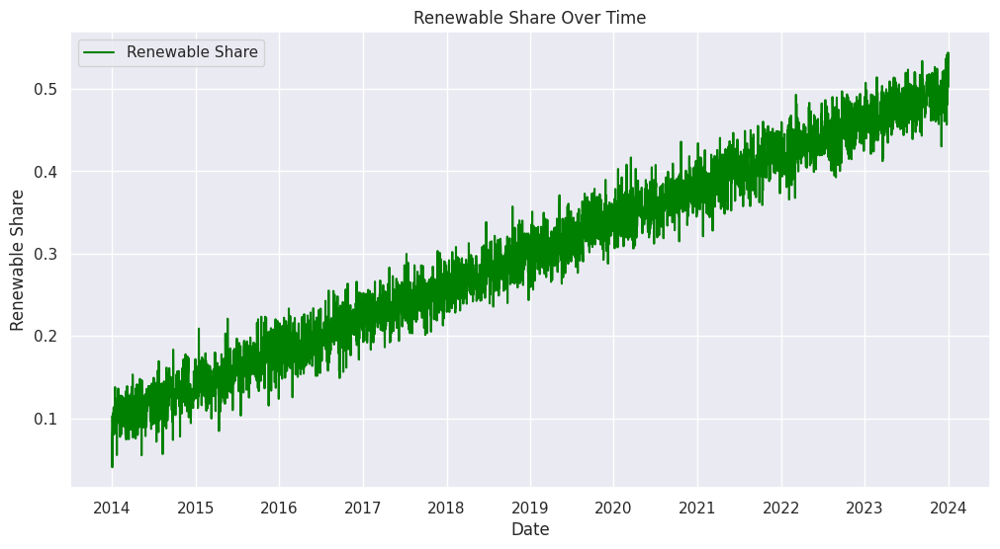


Average Energy Consumption on Holidays vs Non-Holidays:

IsHoliday
0    186.465726
1    105.422838
Name: EnergyConsumption, dtype: float64


<ipython-input-7-3f2a6a93d5cf>:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=holiday_consumption.index, y=holiday_consumption.values, palette='muted')


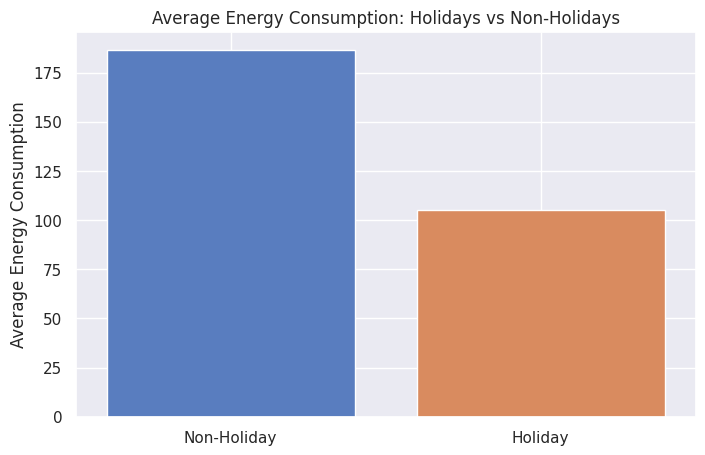

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = '/content/synthetic_energy_forecasting.csv'
data = pd.read_csv(file_path)

# Convert 'Date' to datetime format
data['Date'] = pd.to_datetime(data['Date'])

# Set the 'Date' as the index for easier plotting
data.set_index('Date', inplace=True)

# Display basic statistics
print("Basic Statistics:\n")
print(data.describe())

# Plot Energy Consumption over Time
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['EnergyConsumption'], label='Energy Consumption', color='blue')
plt.title('Energy Consumption Over Time')
plt.xlabel('Date')
plt.ylabel('Energy Consumption')
plt.legend()
plt.grid(True)
plt.show()

# Plot Energy Price over Time
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['EnergyPrice'], label='Energy Price', color='red')
plt.title('Energy Price Over Time')
plt.xlabel('Date')
plt.ylabel('Energy Price')
plt.legend()
plt.grid(True)
plt.show()

# Correlation Heatmap
plt.figure(figsize=(10, 8))
correlation = data.corr()
sns.heatmap(correlation, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

# Plot Relationship between Temperature and Energy Consumption
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Temperature', y='EnergyConsumption', data=data, hue='IsHoliday', palette='viridis')
plt.title('Temperature vs. Energy Consumption')
plt.xlabel('Temperature')
plt.ylabel('Energy Consumption')
plt.legend(title='IsHoliday', labels=['Not Holiday', 'Holiday'])
plt.grid(True)
plt.show()

# Renewable Share Trend
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['RenewableShare'], label='Renewable Share', color='green')
plt.title('Renewable Share Over Time')
plt.xlabel('Date')
plt.ylabel('Renewable Share')
plt.legend()
plt.grid(True)
plt.show()

# Group by Holiday and Non-Holiday for Energy Consumption Analysis
holiday_consumption = data.groupby('IsHoliday')['EnergyConsumption'].mean()
print("\nAverage Energy Consumption on Holidays vs Non-Holidays:\n")
print(holiday_consumption)

# Bar Plot for Energy Consumption on Holidays vs Non-Holidays
plt.figure(figsize=(8, 5))
sns.barplot(x=holiday_consumption.index, y=holiday_consumption.values, palette='muted')
plt.xticks([0, 1], ['Non-Holiday', 'Holiday'])
plt.title('Average Energy Consumption: Holidays vs Non-Holidays')
plt.ylabel('Average Energy Consumption')
plt.xlabel('')
plt.grid(True)
plt.show()


Basic Statistics:

              Year        Month          Day    DayOfWeek    IsHoliday  \
count  3653.000000  3653.000000  3653.000000  3653.000000  3653.000000   
mean   2018.501232     6.522037    15.723789     3.000547     0.005749   
std       2.873341     3.449744     8.802698     2.000274     0.075612   
min    2014.000000     1.000000     1.000000     0.000000     0.000000   
25%    2016.000000     4.000000     8.000000     1.000000     0.000000   
50%    2019.000000     7.000000    16.000000     3.000000     0.000000   
75%    2021.000000    10.000000    23.000000     5.000000     0.000000   
max    2024.000000    12.000000    31.000000     6.000000     1.000000   

       Temperature  EnergyPrice  EnergyConsumption  RenewableShare  
count  3653.000000  3653.000000        3653.000000     3653.000000  
mean     14.599063     0.122316         185.999835        0.300366  
std      10.981373     0.010290          62.036386        0.117407  
min     -14.955680     0.089496       

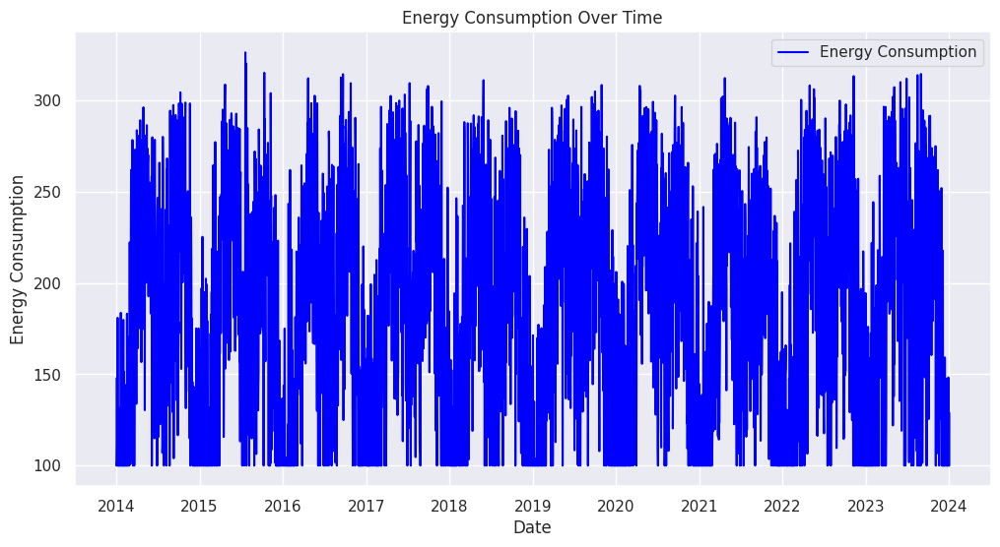

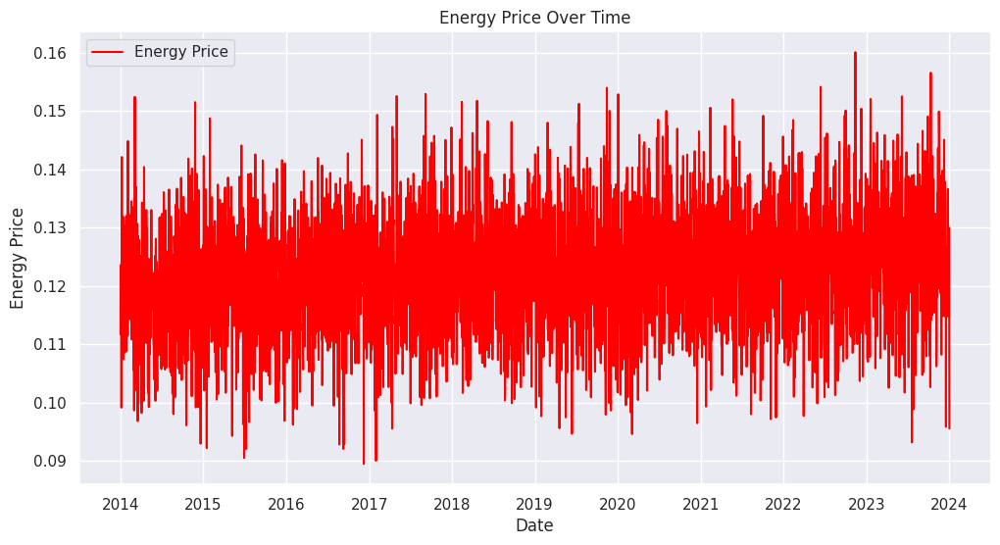

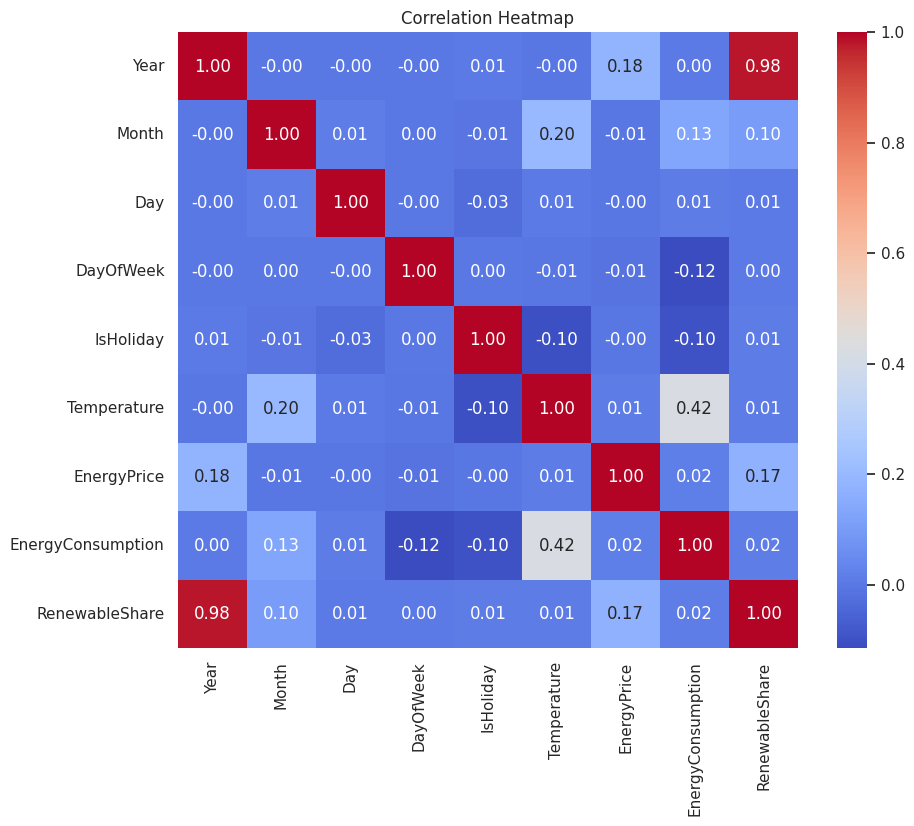

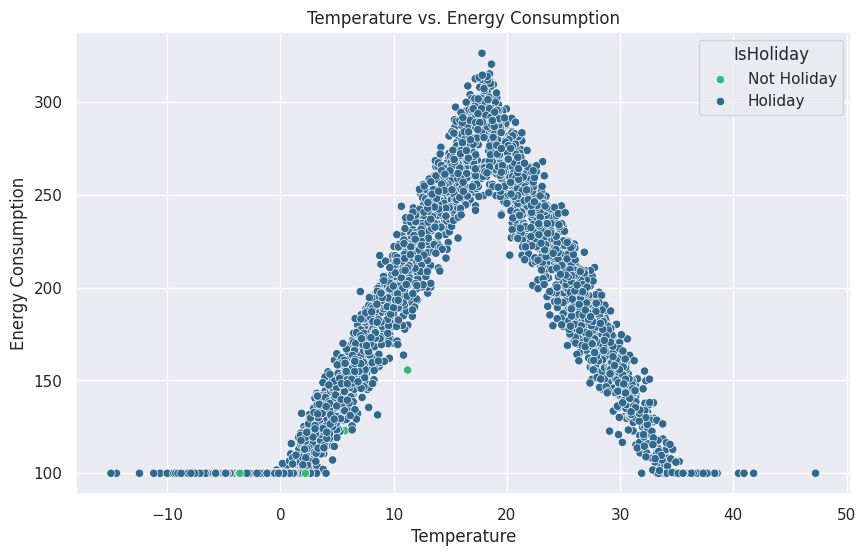

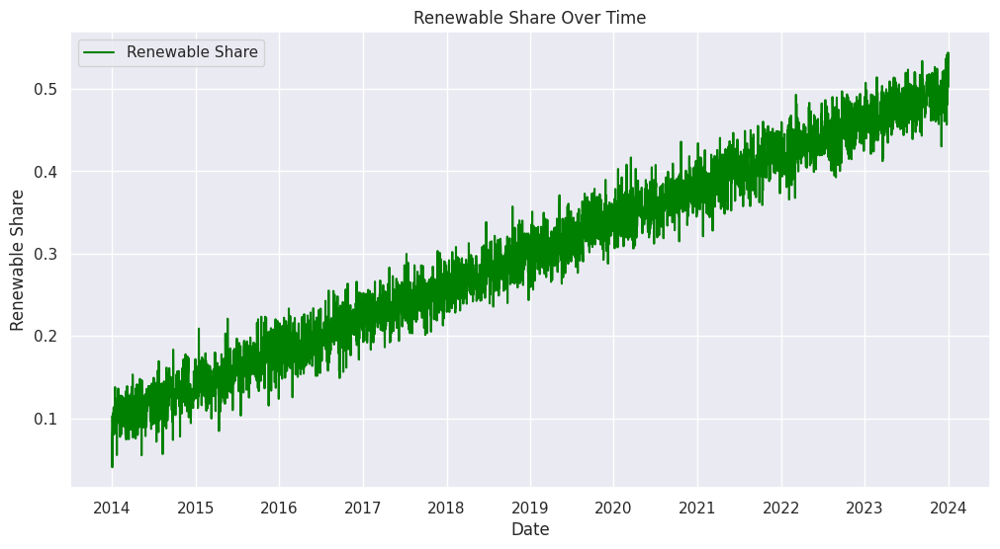


Average Energy Consumption on Holidays vs Non-Holidays:

IsHoliday
0    186.465726
1    105.422838
Name: EnergyConsumption, dtype: float64


<ipython-input-8-cf37ab4cb647>:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=holiday_consumption.index, y=holiday_consumption.values, palette='muted')


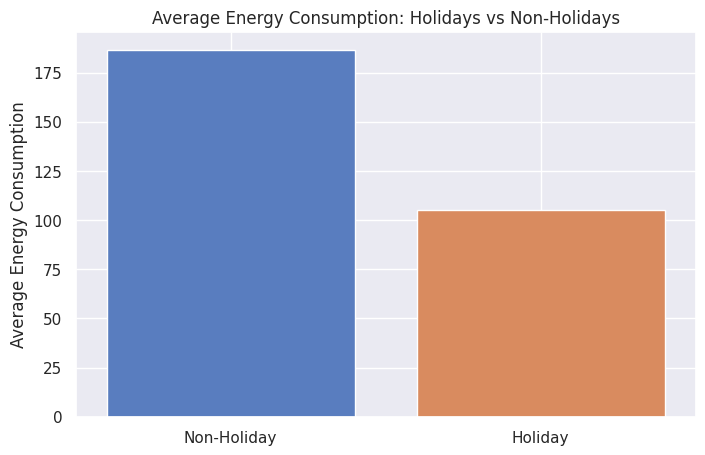

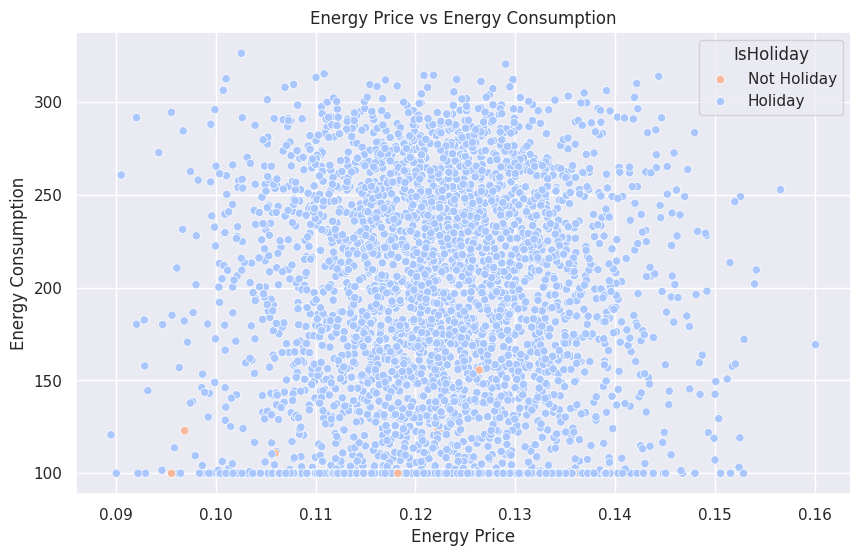

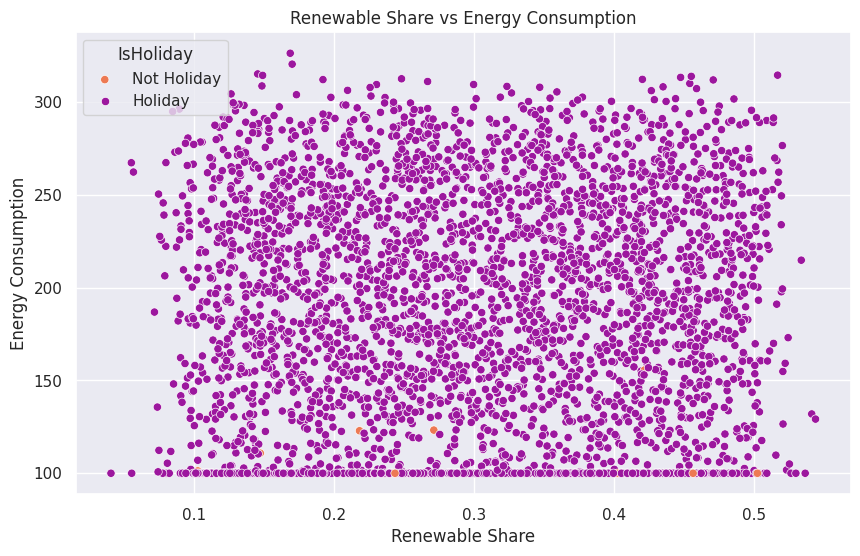

In [8]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = '/content/synthetic_energy_forecasting.csv'
data = pd.read_csv(file_path)

# Convert 'Date' to datetime format
data['Date'] = pd.to_datetime(data['Date'])

# Set the 'Date' as the index for easier plotting
data.set_index('Date', inplace=True)

# Display basic statistics
print("Basic Statistics:\n")
print(data.describe())

# Plot Energy Consumption over Time
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['EnergyConsumption'], label='Energy Consumption', color='blue')
plt.title('Energy Consumption Over Time')
plt.xlabel('Date')
plt.ylabel('Energy Consumption')
plt.legend()
plt.grid(True)
plt.show()

# Plot Energy Price over Time
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['EnergyPrice'], label='Energy Price', color='red')
plt.title('Energy Price Over Time')
plt.xlabel('Date')
plt.ylabel('Energy Price')
plt.legend()
plt.grid(True)
plt.show()

# Correlation Heatmap
plt.figure(figsize=(10, 8))
correlation = data.corr()
sns.heatmap(correlation, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

# Plot Relationship between Temperature and Energy Consumption
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Temperature', y='EnergyConsumption', data=data, hue='IsHoliday', palette='viridis')
plt.title('Temperature vs. Energy Consumption')
plt.xlabel('Temperature')
plt.ylabel('Energy Consumption')
plt.legend(title='IsHoliday', labels=['Not Holiday', 'Holiday'])
plt.grid(True)
plt.show()

# Renewable Share Trend
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['RenewableShare'], label='Renewable Share', color='green')
plt.title('Renewable Share Over Time')
plt.xlabel('Date')
plt.ylabel('Renewable Share')
plt.legend()
plt.grid(True)
plt.show()

# Group by Holiday and Non-Holiday for Energy Consumption Analysis
holiday_consumption = data.groupby('IsHoliday')['EnergyConsumption'].mean()
print("\nAverage Energy Consumption on Holidays vs Non-Holidays:\n")
print(holiday_consumption)

# Bar Plot for Energy Consumption on Holidays vs Non-Holidays
plt.figure(figsize=(8, 5))
sns.barplot(x=holiday_consumption.index, y=holiday_consumption.values, palette='muted')
plt.xticks([0, 1], ['Non-Holiday', 'Holiday'])
plt.title('Average Energy Consumption: Holidays vs Non-Holidays')
plt.ylabel('Average Energy Consumption')
plt.xlabel('')
plt.grid(True)
plt.show()

# Scatter Plot: Energy Price vs Energy Consumption
plt.figure(figsize=(10, 6))
sns.scatterplot(x='EnergyPrice', y='EnergyConsumption', data=data, hue='IsHoliday', palette='coolwarm')
plt.title('Energy Price vs Energy Consumption')
plt.xlabel('Energy Price')
plt.ylabel('Energy Consumption')
plt.legend(title='IsHoliday', labels=['Not Holiday', 'Holiday'])
plt.grid(True)
plt.show()

# Scatter Plot: Renewable Share vs Energy Consumption
plt.figure(figsize=(10, 6))
sns.scatterplot(x='RenewableShare', y='EnergyConsumption', data=data, hue='IsHoliday', palette='plasma')
plt.title('Renewable Share vs Energy Consumption')
plt.xlabel('Renewable Share')
plt.ylabel('Energy Consumption')
plt.legend(title='IsHoliday', labels=['Not Holiday', 'Holiday'])
plt.grid(True)
plt.show()


Basic Statistics:

              Year        Month          Day    DayOfWeek    IsHoliday  \
count  3653.000000  3653.000000  3653.000000  3653.000000  3653.000000   
mean   2018.501232     6.522037    15.723789     3.000547     0.005749   
std       2.873341     3.449744     8.802698     2.000274     0.075612   
min    2014.000000     1.000000     1.000000     0.000000     0.000000   
25%    2016.000000     4.000000     8.000000     1.000000     0.000000   
50%    2019.000000     7.000000    16.000000     3.000000     0.000000   
75%    2021.000000    10.000000    23.000000     5.000000     0.000000   
max    2024.000000    12.000000    31.000000     6.000000     1.000000   

       Temperature  EnergyPrice  EnergyConsumption  RenewableShare  
count  3653.000000  3653.000000        3653.000000     3653.000000  
mean     14.599063     0.122316         185.999835        0.300366  
std      10.981373     0.010290          62.036386        0.117407  
min     -14.955680     0.089496       

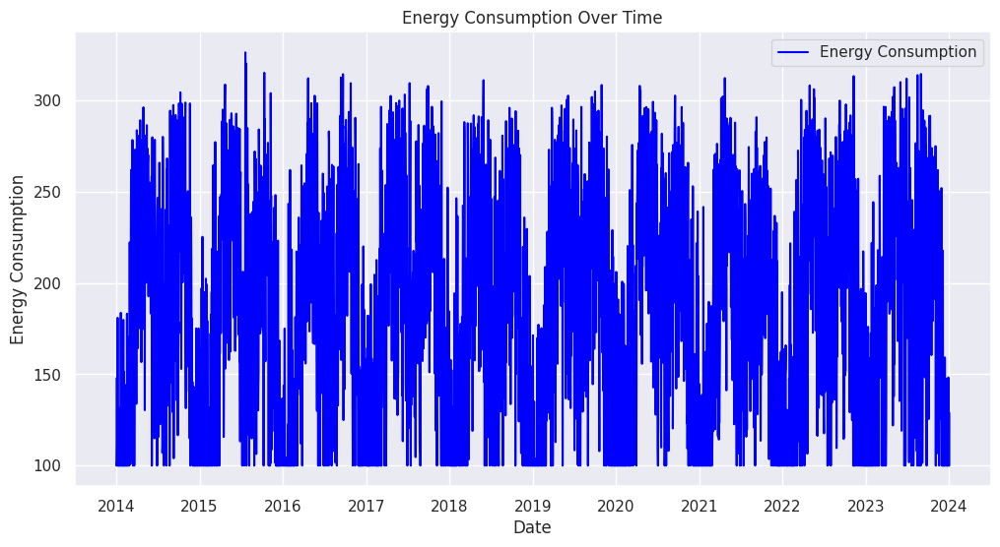

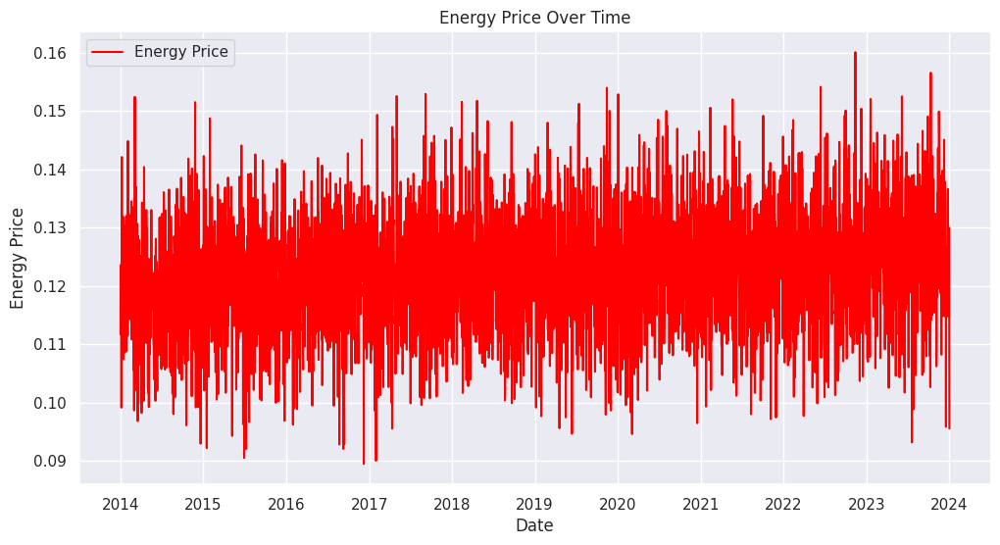

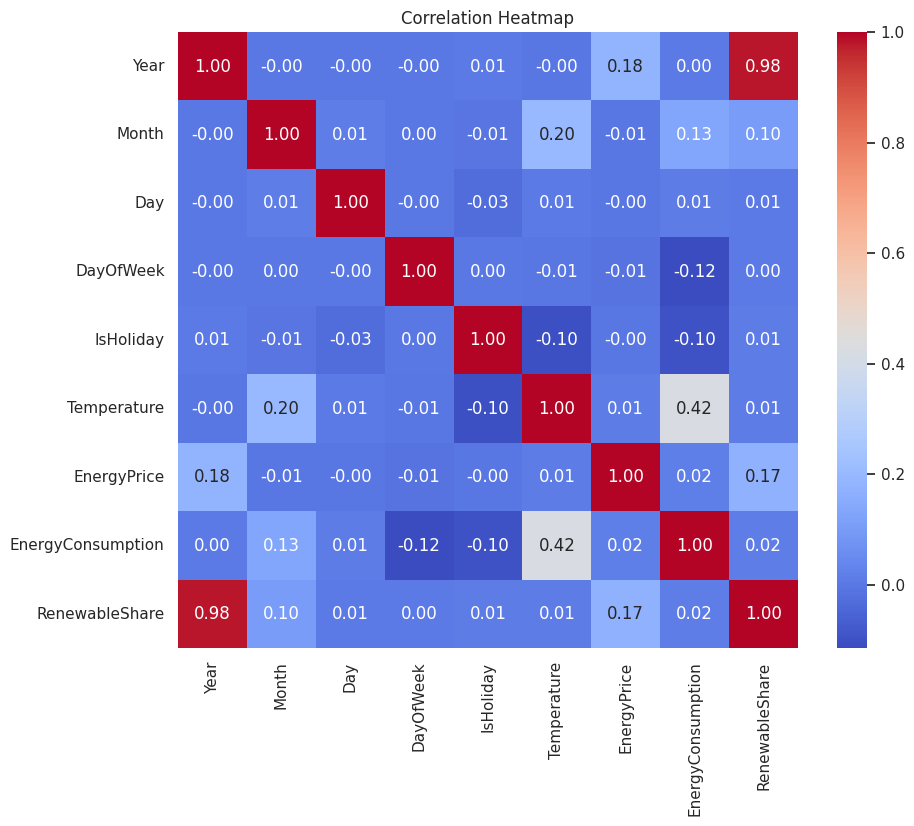

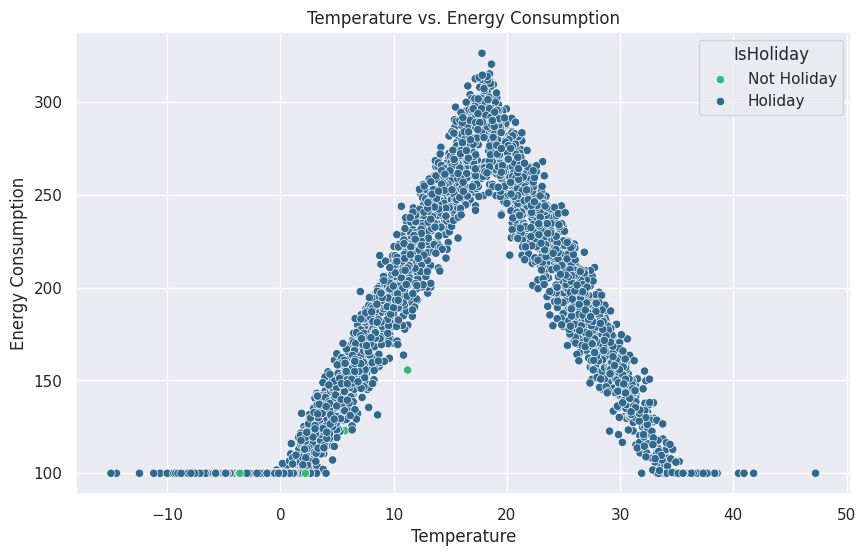

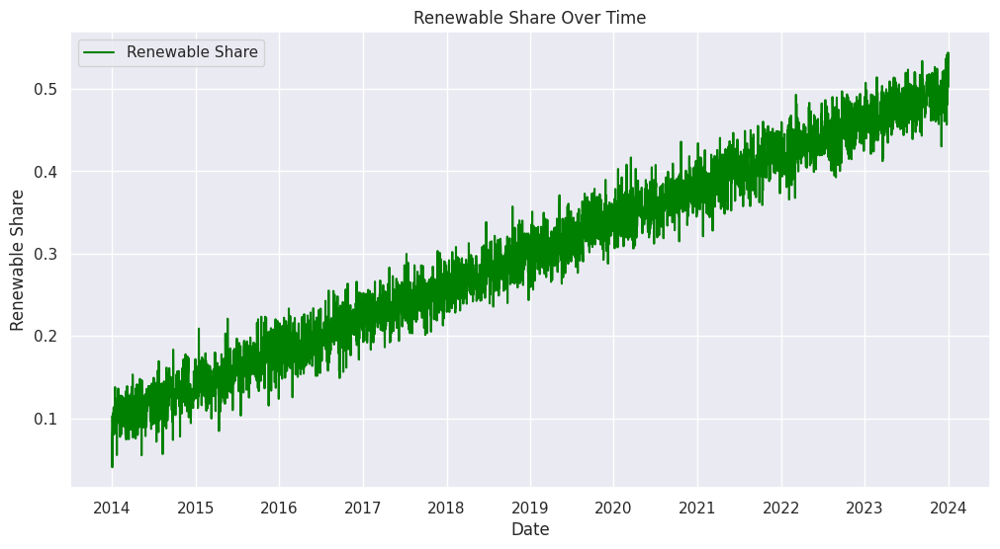


Average Energy Consumption on Holidays vs Non-Holidays:

IsHoliday
0    186.465726
1    105.422838
Name: EnergyConsumption, dtype: float64


<ipython-input-9-1a0849162bc0>:73: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=holiday_consumption.index, y=holiday_consumption.values, palette='muted')


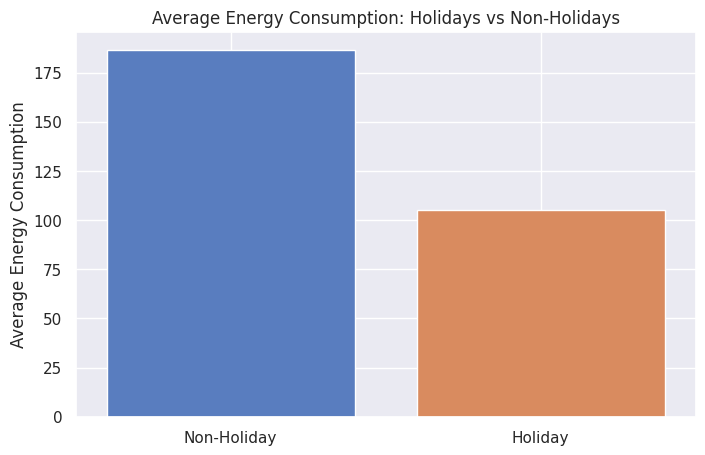

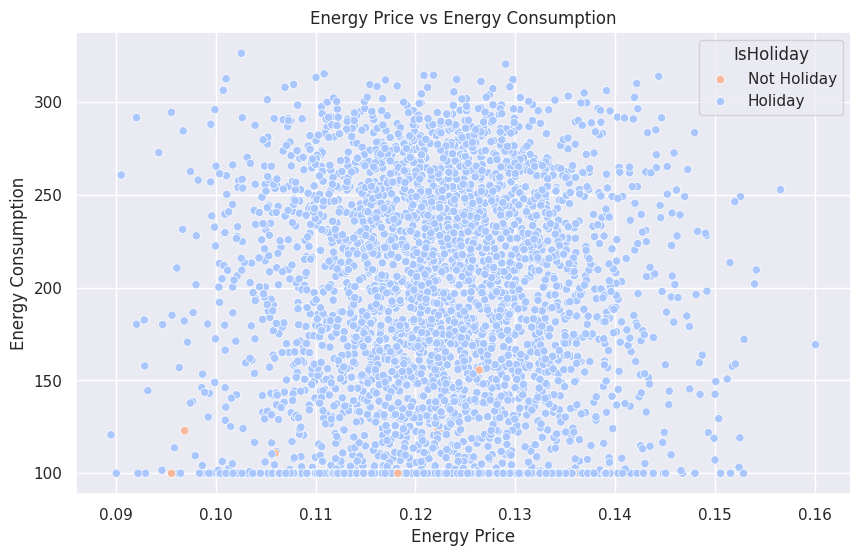

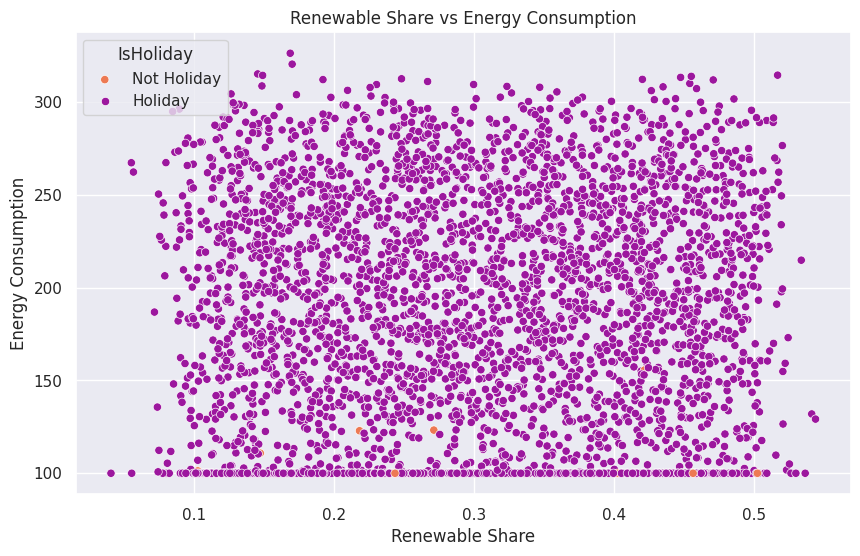

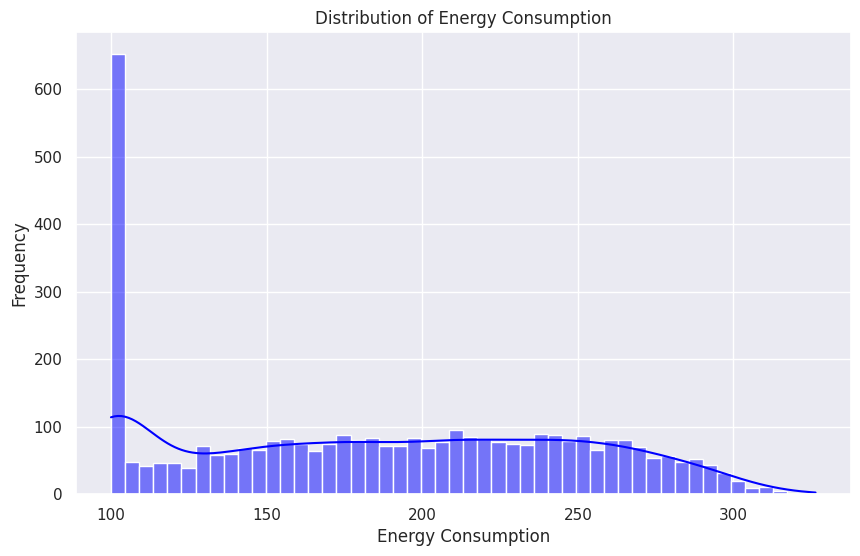

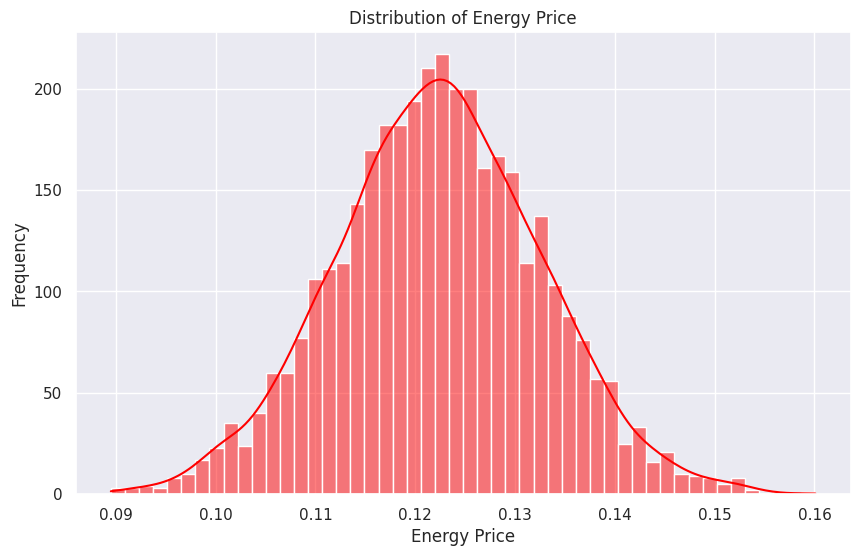

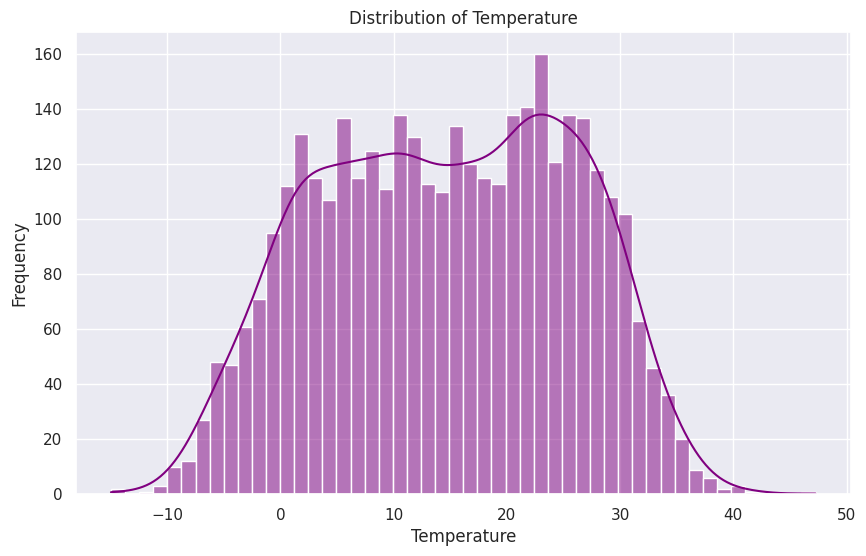

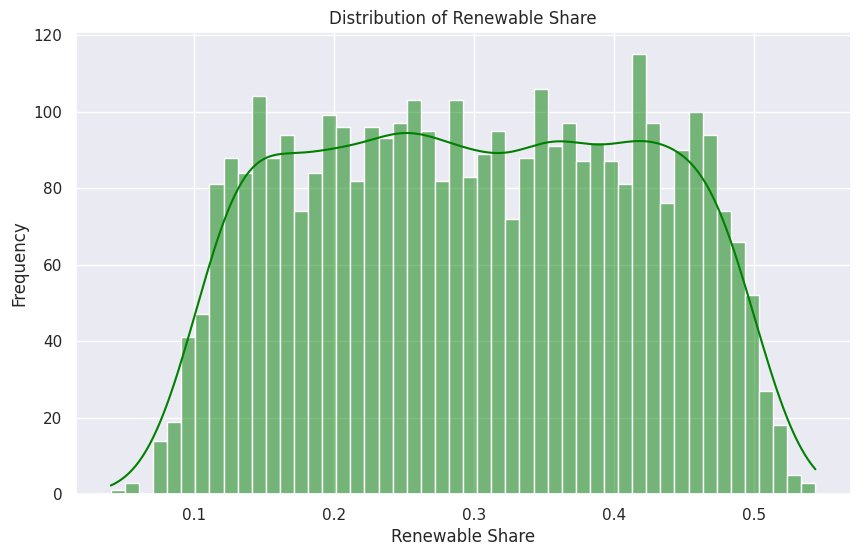

In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the dataset
file_path = '/content/synthetic_energy_forecasting.csv'
data = pd.read_csv(file_path)

# Convert 'Date' to datetime format
data['Date'] = pd.to_datetime(data['Date'])

# Set the 'Date' as the index for easier plotting
data.set_index('Date', inplace=True)

# Display basic statistics
print("Basic Statistics:\n")
print(data.describe())

# Plot Energy Consumption over Time
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['EnergyConsumption'], label='Energy Consumption', color='blue')
plt.title('Energy Consumption Over Time')
plt.xlabel('Date')
plt.ylabel('Energy Consumption')
plt.legend()
plt.grid(True)
plt.show()

# Plot Energy Price over Time
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['EnergyPrice'], label='Energy Price', color='red')
plt.title('Energy Price Over Time')
plt.xlabel('Date')
plt.ylabel('Energy Price')
plt.legend()
plt.grid(True)
plt.show()

# Correlation Heatmap
plt.figure(figsize=(10, 8))
correlation = data.corr()
sns.heatmap(correlation, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

# Plot Relationship between Temperature and Energy Consumption
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Temperature', y='EnergyConsumption', data=data, hue='IsHoliday', palette='viridis')
plt.title('Temperature vs. Energy Consumption')
plt.xlabel('Temperature')
plt.ylabel('Energy Consumption')
plt.legend(title='IsHoliday', labels=['Not Holiday', 'Holiday'])
plt.grid(True)
plt.show()

# Renewable Share Trend
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['RenewableShare'], label='Renewable Share', color='green')
plt.title('Renewable Share Over Time')
plt.xlabel('Date')
plt.ylabel('Renewable Share')
plt.legend()
plt.grid(True)
plt.show()

# Group by Holiday and Non-Holiday for Energy Consumption Analysis
holiday_consumption = data.groupby('IsHoliday')['EnergyConsumption'].mean()
print("\nAverage Energy Consumption on Holidays vs Non-Holidays:\n")
print(holiday_consumption)

# Bar Plot for Energy Consumption on Holidays vs Non-Holidays
plt.figure(figsize=(8, 5))
sns.barplot(x=holiday_consumption.index, y=holiday_consumption.values, palette='muted')
plt.xticks([0, 1], ['Non-Holiday', 'Holiday'])
plt.title('Average Energy Consumption: Holidays vs Non-Holidays')
plt.ylabel('Average Energy Consumption')
plt.xlabel('')
plt.grid(True)
plt.show()

# Scatter Plot: Energy Price vs Energy Consumption
plt.figure(figsize=(10, 6))
sns.scatterplot(x='EnergyPrice', y='EnergyConsumption', data=data, hue='IsHoliday', palette='coolwarm')
plt.title('Energy Price vs Energy Consumption')
plt.xlabel('Energy Price')
plt.ylabel('Energy Consumption')
plt.legend(title='IsHoliday', labels=['Not Holiday', 'Holiday'])
plt.grid(True)
plt.show()

# Scatter Plot: Renewable Share vs Energy Consumption
plt.figure(figsize=(10, 6))
sns.scatterplot(x='RenewableShare', y='EnergyConsumption', data=data, hue='IsHoliday', palette='plasma')
plt.title('Renewable Share vs Energy Consumption')
plt.xlabel('Renewable Share')
plt.ylabel('Energy Consumption')
plt.legend(title='IsHoliday', labels=['Not Holiday', 'Holiday'])
plt.grid(True)
plt.show()

# Distribution Analysis

# Distribution of Energy Consumption
plt.figure(figsize=(10, 6))
sns.histplot(data['EnergyConsumption'], bins=50, kde=True, color='blue')
plt.title('Distribution of Energy Consumption')
plt.xlabel('Energy Consumption')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Distribution of Energy Price
plt.figure(figsize=(10, 6))
sns.histplot(data['EnergyPrice'], bins=50, kde=True, color='red')
plt.title('Distribution of Energy Price')
plt.xlabel('Energy Price')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Distribution of Temperature
plt.figure(figsize=(10, 6))
sns.histplot(data['Temperature'], bins=50, kde=True, color='purple')
plt.title('Distribution of Temperature')
plt.xlabel('Temperature')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Distribution of Renewable Share
plt.figure(figsize=(10, 6))
sns.histplot(data['RenewableShare'], bins=50, kde=True, color='green')
plt.title('Distribution of Renewable Share')
plt.xlabel('Renewable Share')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()


Basic Statistics:

              Year        Month          Day    DayOfWeek    IsHoliday  \
count  3653.000000  3653.000000  3653.000000  3653.000000  3653.000000   
mean   2018.501232     6.522037    15.723789     3.000547     0.005749   
std       2.873341     3.449744     8.802698     2.000274     0.075612   
min    2014.000000     1.000000     1.000000     0.000000     0.000000   
25%    2016.000000     4.000000     8.000000     1.000000     0.000000   
50%    2019.000000     7.000000    16.000000     3.000000     0.000000   
75%    2021.000000    10.000000    23.000000     5.000000     0.000000   
max    2024.000000    12.000000    31.000000     6.000000     1.000000   

       Temperature  EnergyPrice  EnergyConsumption  RenewableShare  
count  3653.000000  3653.000000        3653.000000     3653.000000  
mean     14.599063     0.122316         185.999835        0.300366  
std      10.981373     0.010290          62.036386        0.117407  
min     -14.955680     0.089496       

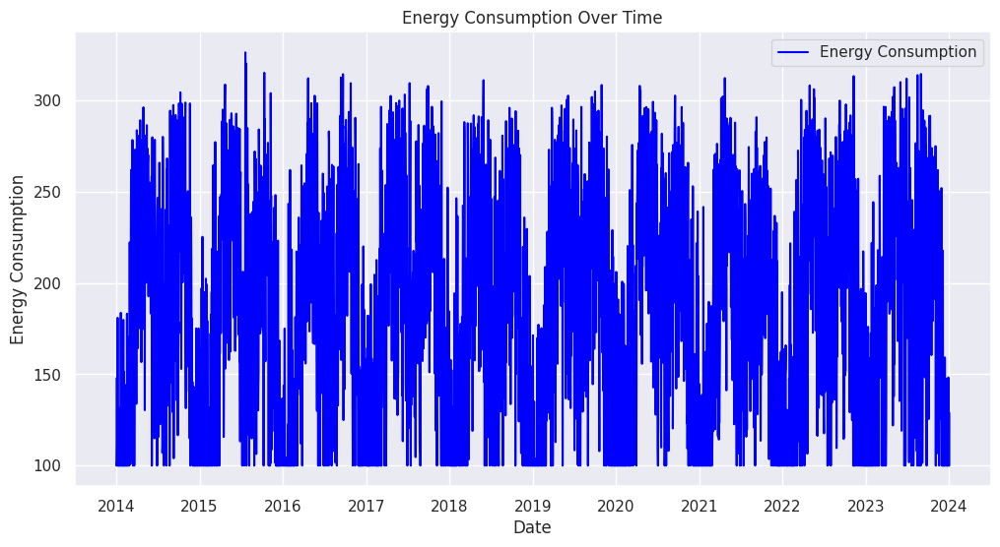

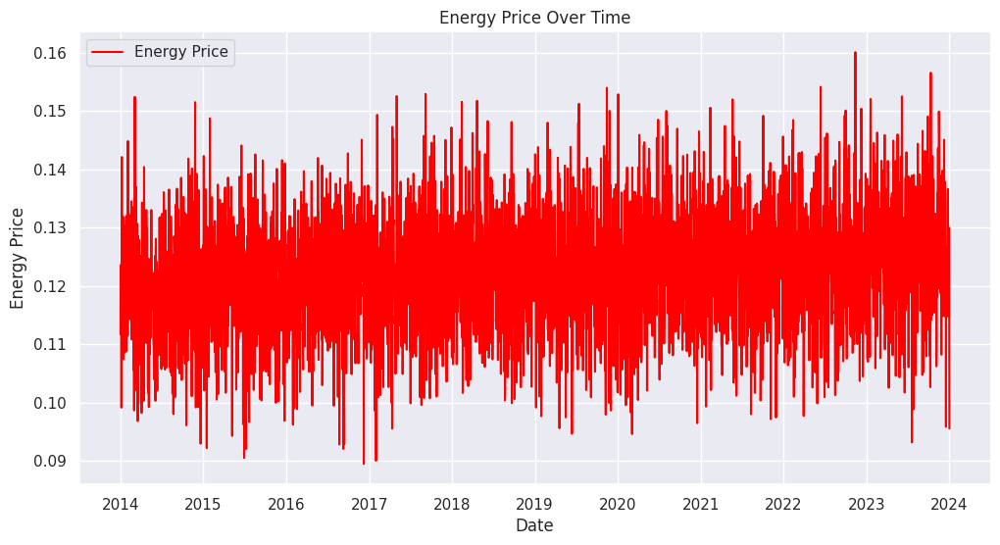

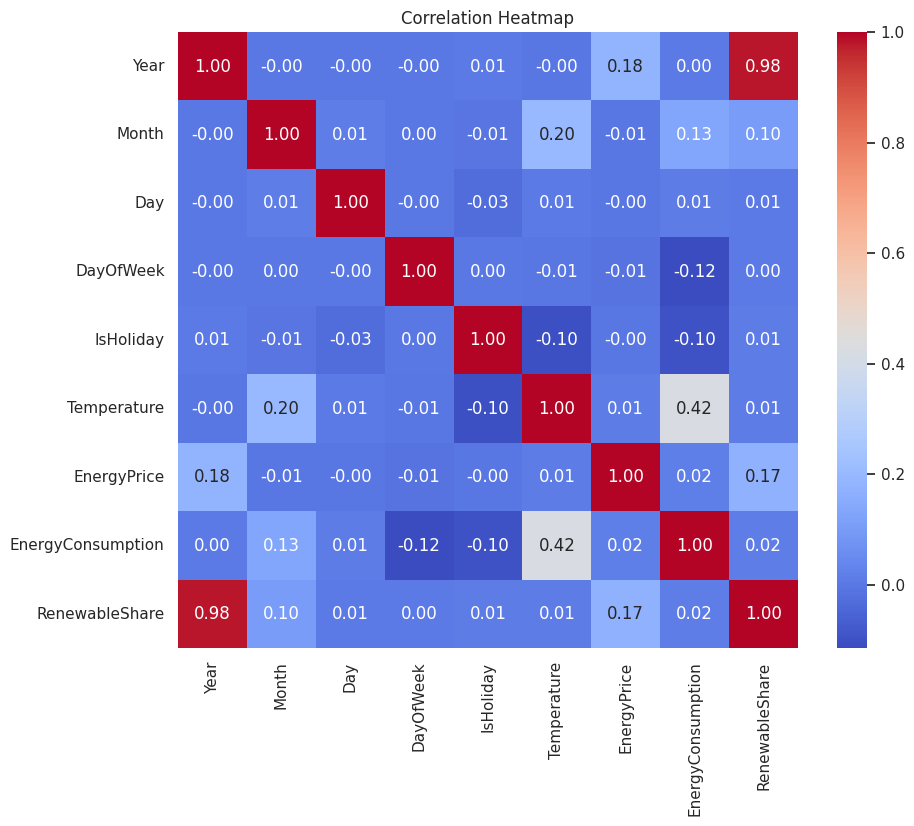

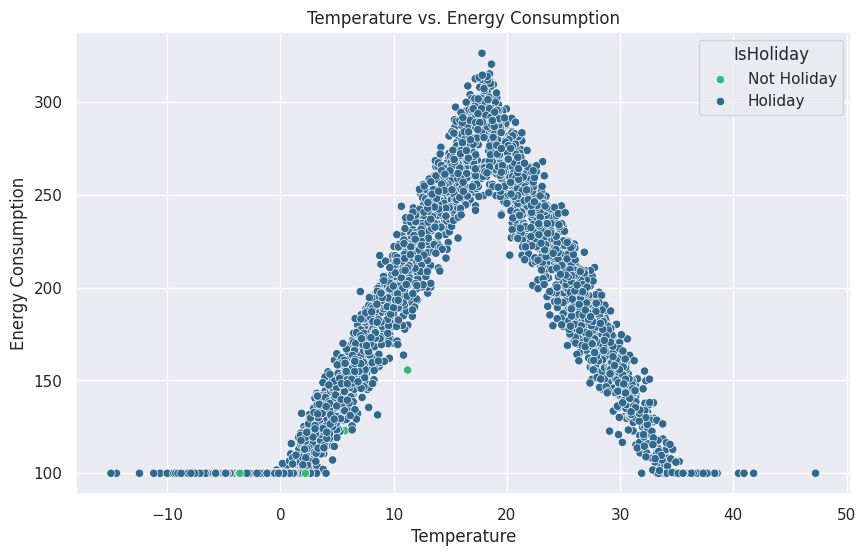

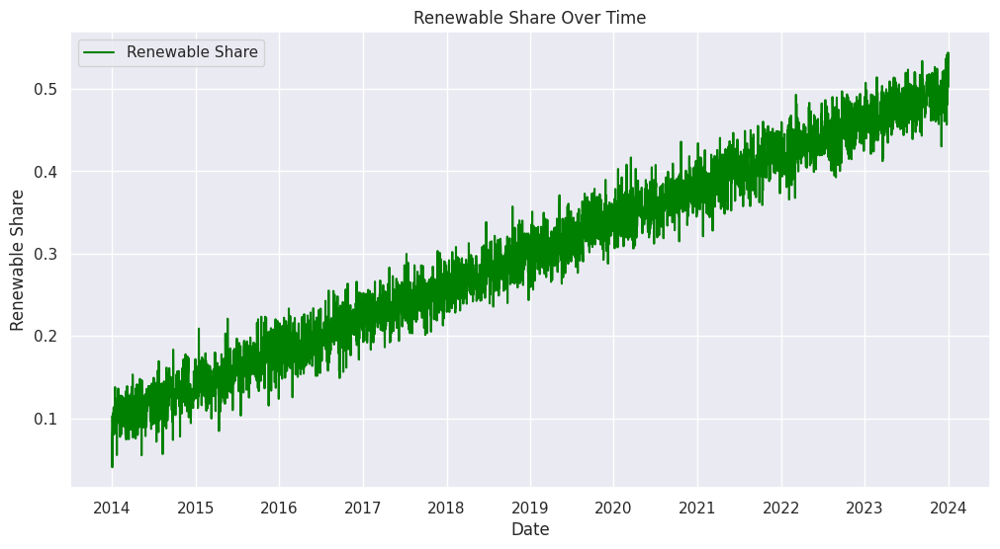


Average Energy Consumption on Holidays vs Non-Holidays:

IsHoliday
0    186.465726
1    105.422838
Name: EnergyConsumption, dtype: float64


<ipython-input-11-b7b38c782091>:74: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=holiday_consumption.index, y=holiday_consumption.values, palette='muted')


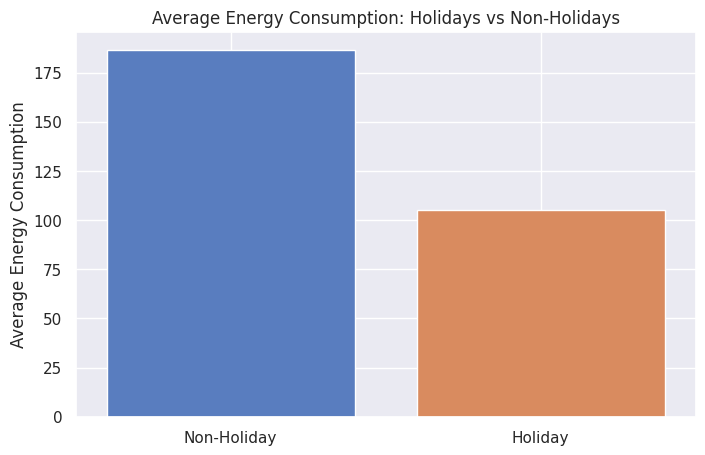

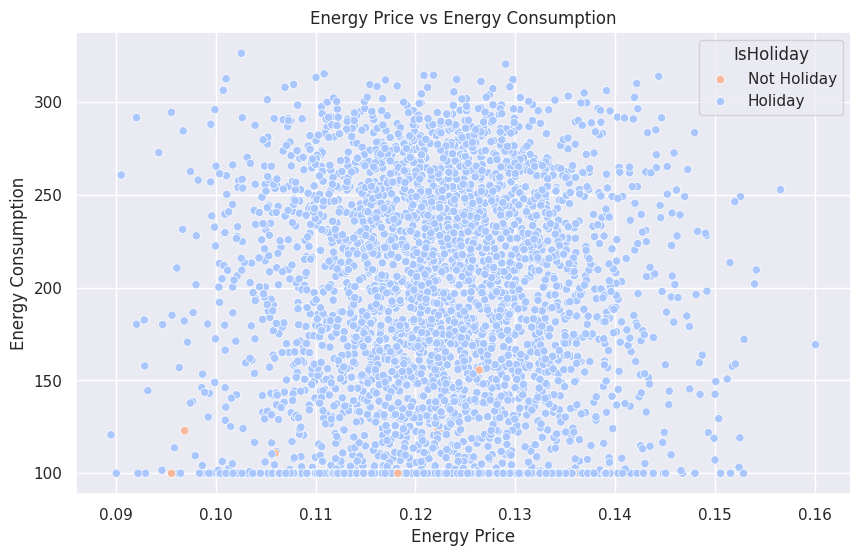

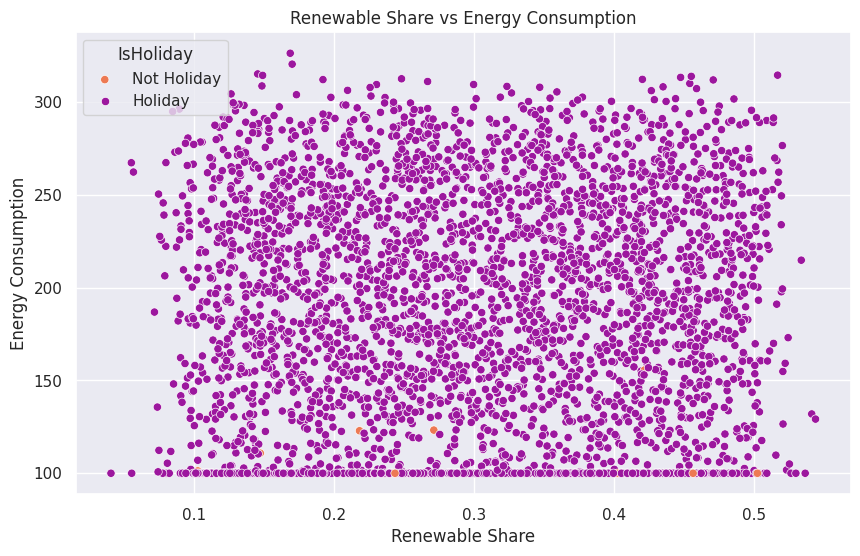

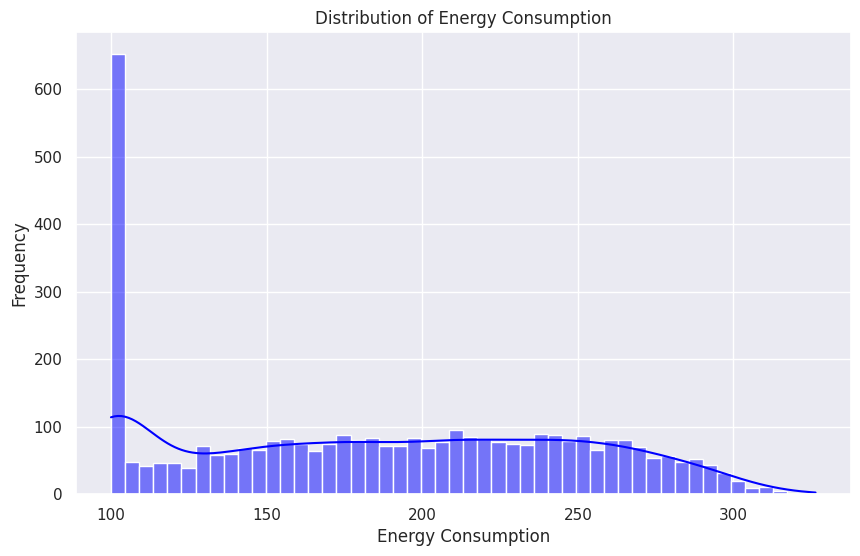

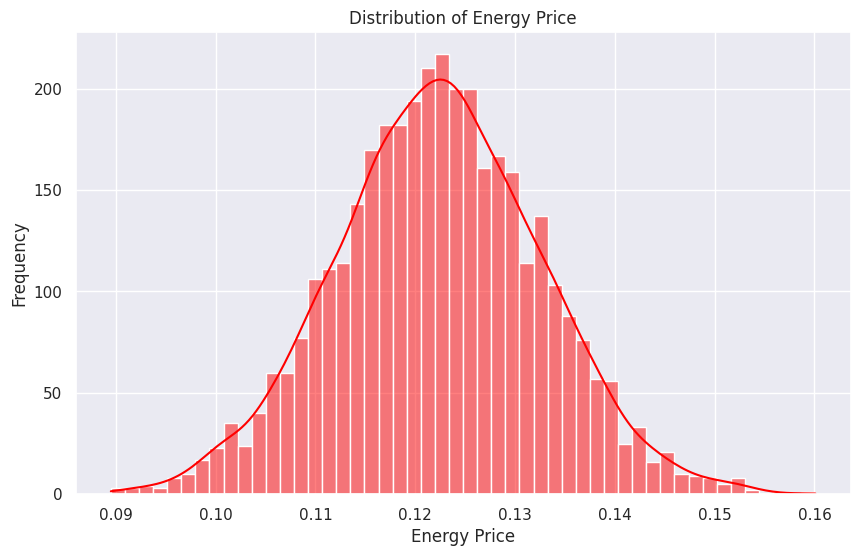

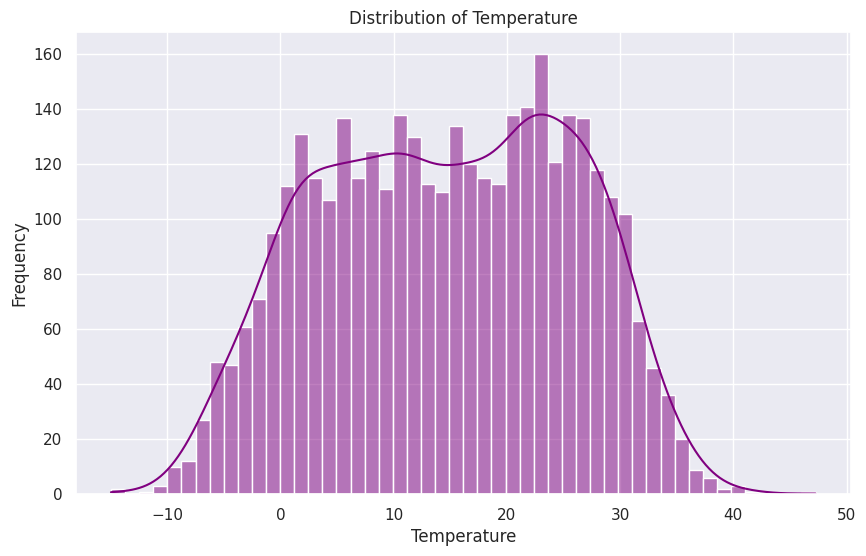

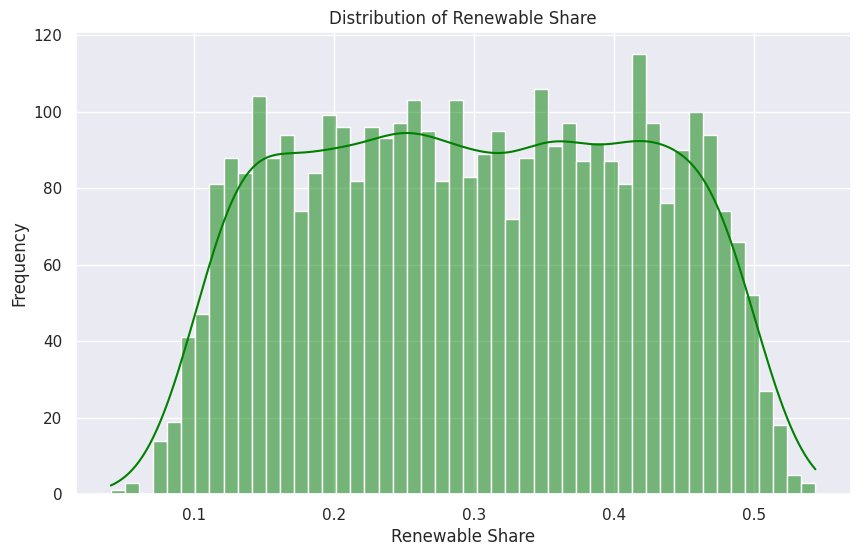


Train and Test Set Sizes:
Training set: 2922 samples
Testing set: 731 samples


In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split

# Load the dataset
file_path = '/content/synthetic_energy_forecasting.csv'
data = pd.read_csv(file_path)

# Convert 'Date' to datetime format
data['Date'] = pd.to_datetime(data['Date'])

# Set the 'Date' as the index for easier plotting
data.set_index('Date', inplace=True)

# Display basic statistics
print("Basic Statistics:\n")
print(data.describe())

# Plot Energy Consumption over Time
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['EnergyConsumption'], label='Energy Consumption', color='blue')
plt.title('Energy Consumption Over Time')
plt.xlabel('Date')
plt.ylabel('Energy Consumption')
plt.legend()
plt.grid(True)
plt.show()

# Plot Energy Price over Time
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['EnergyPrice'], label='Energy Price', color='red')
plt.title('Energy Price Over Time')
plt.xlabel('Date')
plt.ylabel('Energy Price')
plt.legend()
plt.grid(True)
plt.show()

# Correlation Heatmap
plt.figure(figsize=(10, 8))
correlation = data.corr()
sns.heatmap(correlation, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

# Plot Relationship between Temperature and Energy Consumption
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Temperature', y='EnergyConsumption', data=data, hue='IsHoliday', palette='viridis')
plt.title('Temperature vs. Energy Consumption')
plt.xlabel('Temperature')
plt.ylabel('Energy Consumption')
plt.legend(title='IsHoliday', labels=['Not Holiday', 'Holiday'])
plt.grid(True)
plt.show()

# Renewable Share Trend
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['RenewableShare'], label='Renewable Share', color='green')
plt.title('Renewable Share Over Time')
plt.xlabel('Date')
plt.ylabel('Renewable Share')
plt.legend()
plt.grid(True)
plt.show()

# Group by Holiday and Non-Holiday for Energy Consumption Analysis
holiday_consumption = data.groupby('IsHoliday')['EnergyConsumption'].mean()
print("\nAverage Energy Consumption on Holidays vs Non-Holidays:\n")
print(holiday_consumption)

# Bar Plot for Energy Consumption on Holidays vs Non-Holidays
plt.figure(figsize=(8, 5))
sns.barplot(x=holiday_consumption.index, y=holiday_consumption.values, palette='muted')
plt.xticks([0, 1], ['Non-Holiday', 'Holiday'])
plt.title('Average Energy Consumption: Holidays vs Non-Holidays')
plt.ylabel('Average Energy Consumption')
plt.xlabel('')
plt.grid(True)
plt.show()

# Scatter Plot: Energy Price vs Energy Consumption
plt.figure(figsize=(10, 6))
sns.scatterplot(x='EnergyPrice', y='EnergyConsumption', data=data, hue='IsHoliday', palette='coolwarm')
plt.title('Energy Price vs Energy Consumption')
plt.xlabel('Energy Price')
plt.ylabel('Energy Consumption')
plt.legend(title='IsHoliday', labels=['Not Holiday', 'Holiday'])
plt.grid(True)
plt.show()

# Scatter Plot: Renewable Share vs Energy Consumption
plt.figure(figsize=(10, 6))
sns.scatterplot(x='RenewableShare', y='EnergyConsumption', data=data, hue='IsHoliday', palette='plasma')
plt.title('Renewable Share vs Energy Consumption')
plt.xlabel('Renewable Share')
plt.ylabel('Energy Consumption')
plt.legend(title='IsHoliday', labels=['Not Holiday', 'Holiday'])
plt.grid(True)
plt.show()

# Distribution Analysis

# Distribution of Energy Consumption
plt.figure(figsize=(10, 6))
sns.histplot(data['EnergyConsumption'], bins=50, kde=True, color='blue')
plt.title('Distribution of Energy Consumption')
plt.xlabel('Energy Consumption')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Distribution of Energy Price
plt.figure(figsize=(10, 6))
sns.histplot(data['EnergyPrice'], bins=50, kde=True, color='red')
plt.title('Distribution of Energy Price')
plt.xlabel('Energy Price')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Distribution of Temperature
plt.figure(figsize=(10, 6))
sns.histplot(data['Temperature'], bins=50, kde=True, color='purple')
plt.title('Distribution of Temperature')
plt.xlabel('Temperature')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Distribution of Renewable Share
plt.figure(figsize=(10, 6))
sns.histplot(data['RenewableShare'], bins=50, kde=True, color='green')
plt.title('Distribution of Renewable Share')
plt.xlabel('Renewable Share')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Train-Test Split

# Define the features (X) and target (y)
X = data[['Temperature', 'EnergyPrice', 'RenewableShare', 'IsHoliday', 'DayOfWeek']]
y = data['EnergyConsumption']

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("\nTrain and Test Set Sizes:")
print(f"Training set: {X_train.shape[0]} samples")
print(f"Testing set: {X_test.shape[0]} samples")


Basic Statistics:

              Year        Month          Day    DayOfWeek    IsHoliday  \
count  3653.000000  3653.000000  3653.000000  3653.000000  3653.000000   
mean   2018.501232     6.522037    15.723789     3.000547     0.005749   
std       2.873341     3.449744     8.802698     2.000274     0.075612   
min    2014.000000     1.000000     1.000000     0.000000     0.000000   
25%    2016.000000     4.000000     8.000000     1.000000     0.000000   
50%    2019.000000     7.000000    16.000000     3.000000     0.000000   
75%    2021.000000    10.000000    23.000000     5.000000     0.000000   
max    2024.000000    12.000000    31.000000     6.000000     1.000000   

       Temperature  EnergyPrice  EnergyConsumption  RenewableShare  
count  3653.000000  3653.000000        3653.000000     3653.000000  
mean     14.599063     0.122316         185.999835        0.300366  
std      10.981373     0.010290          62.036386        0.117407  
min     -14.955680     0.089496       

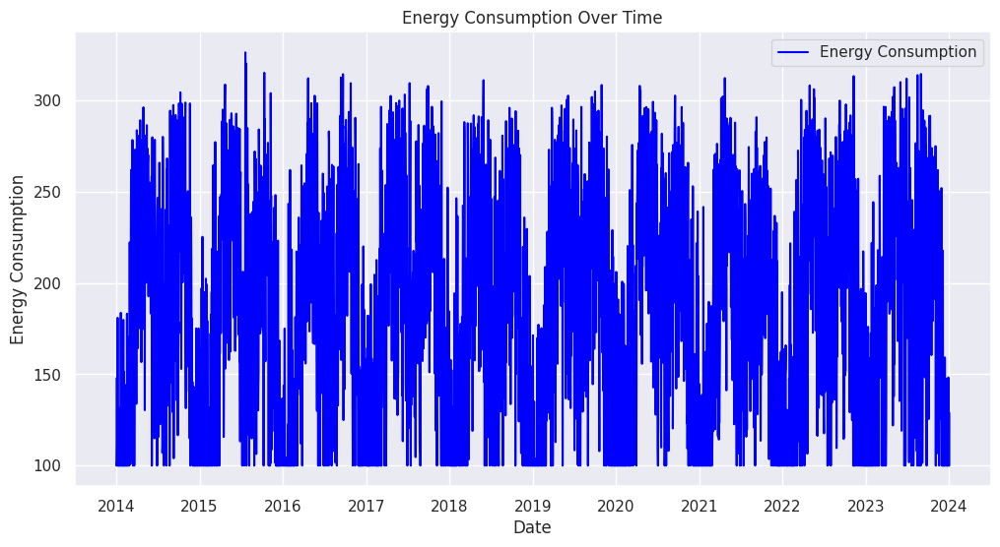

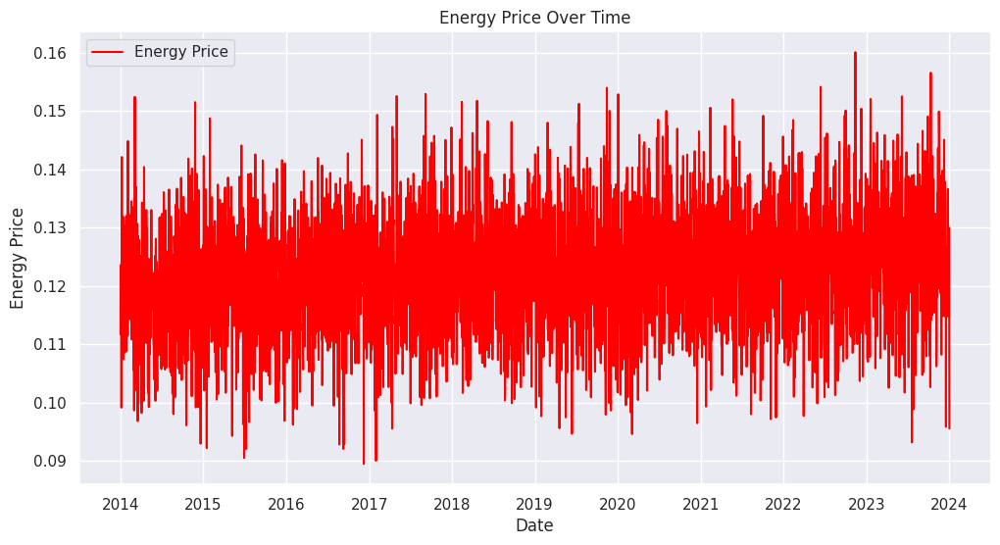

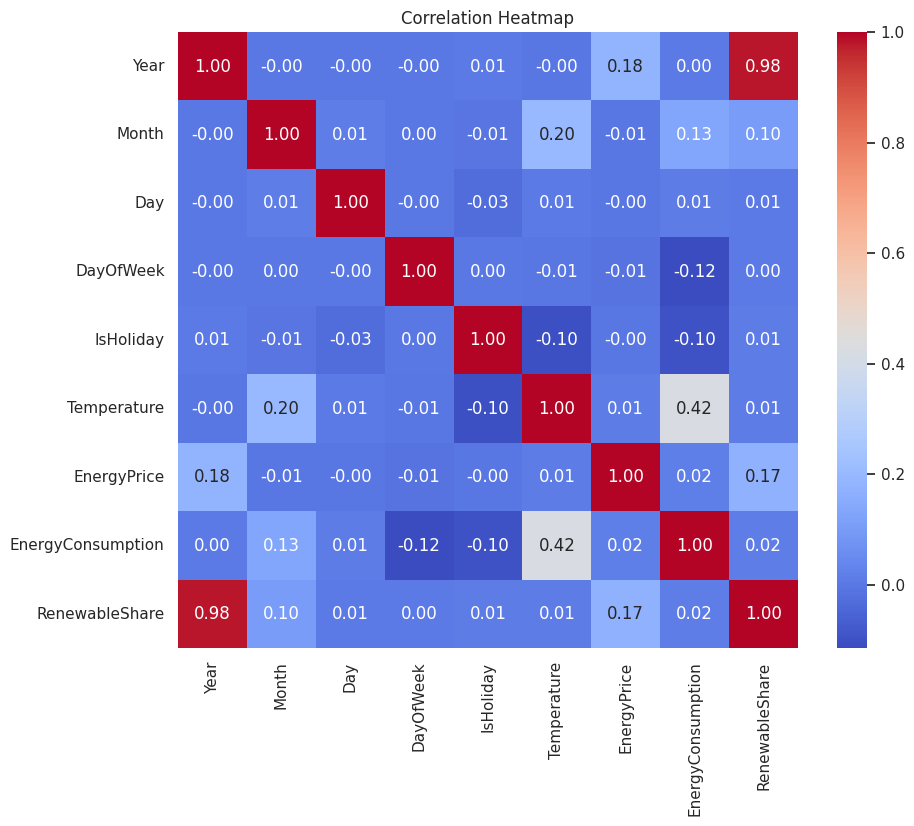

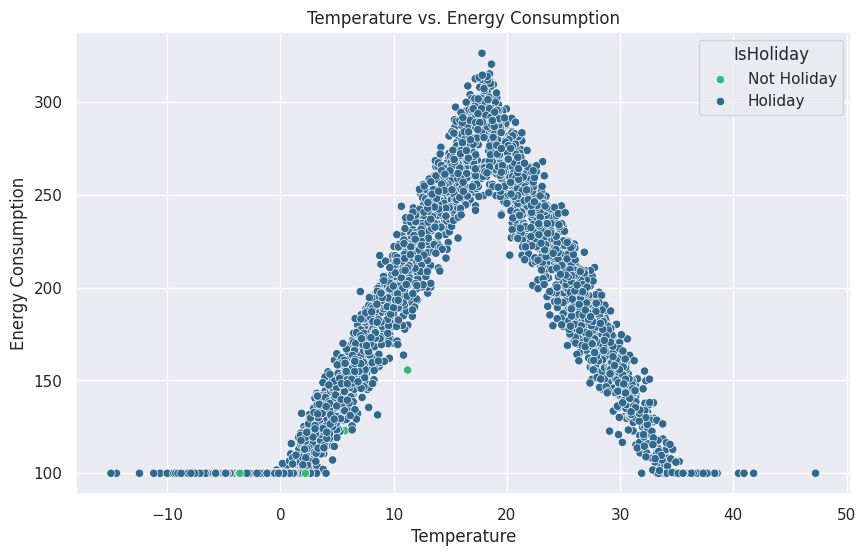

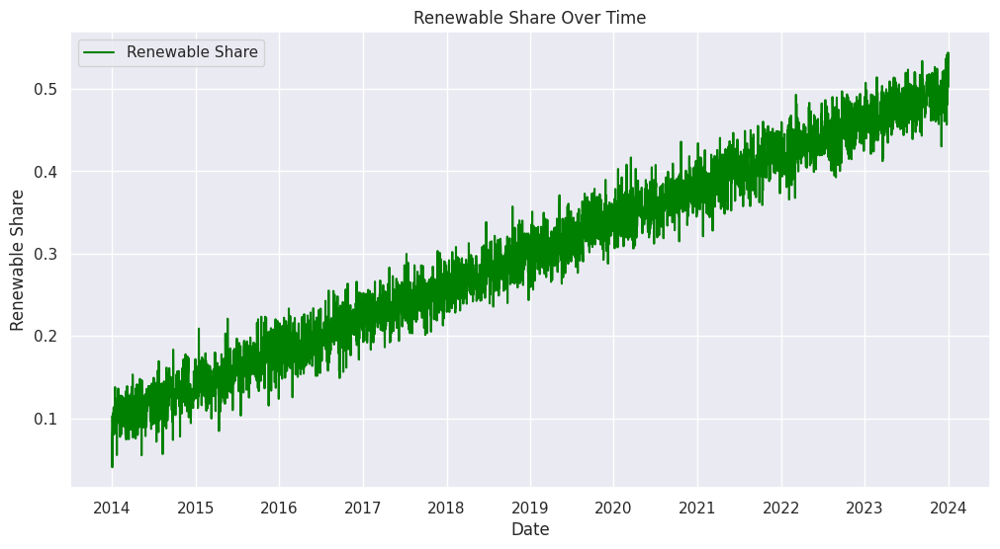


Average Energy Consumption on Holidays vs Non-Holidays:

IsHoliday
0    186.465726
1    105.422838
Name: EnergyConsumption, dtype: float64


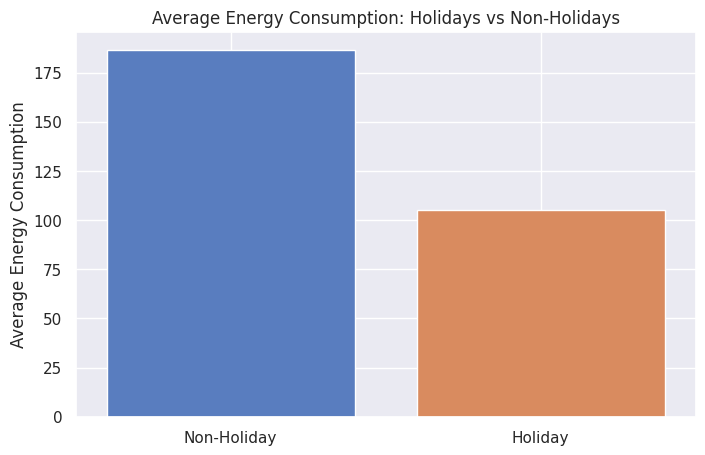

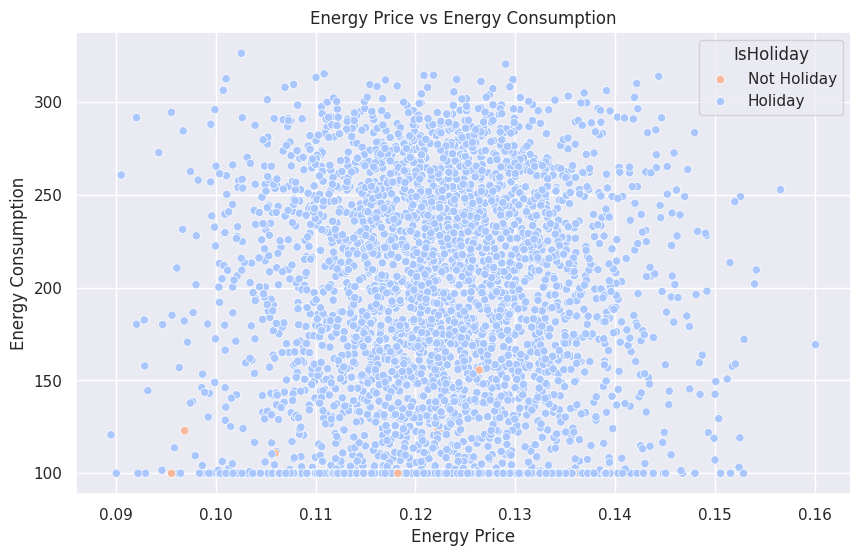

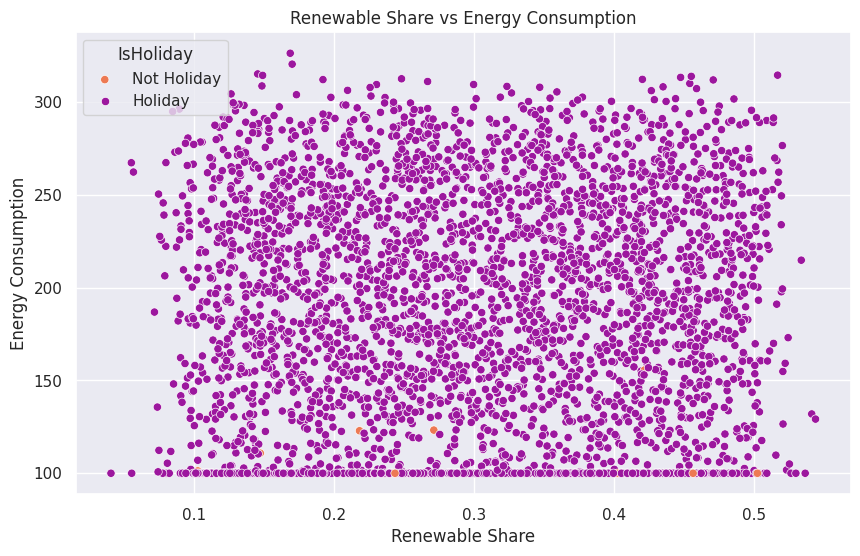

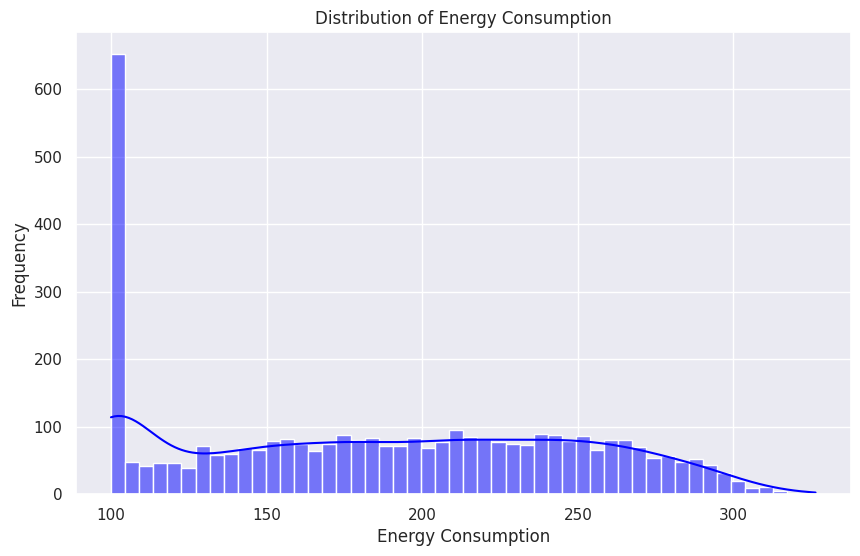

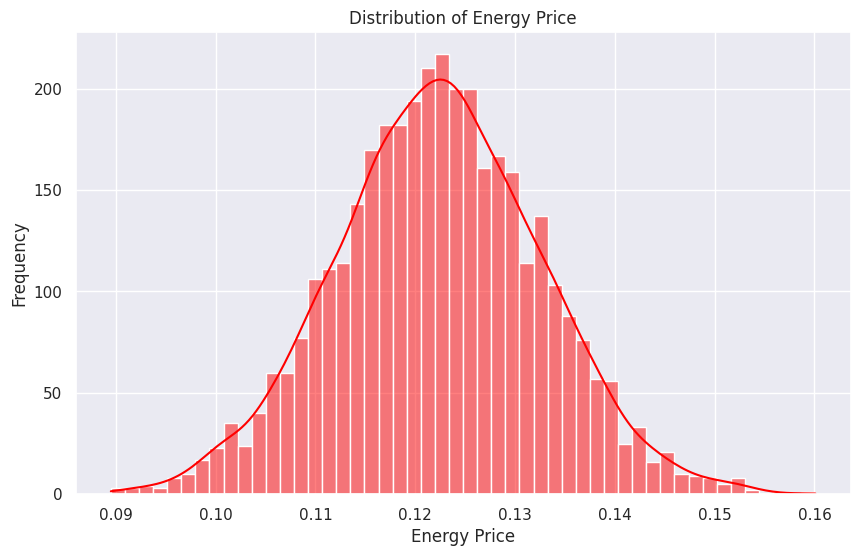

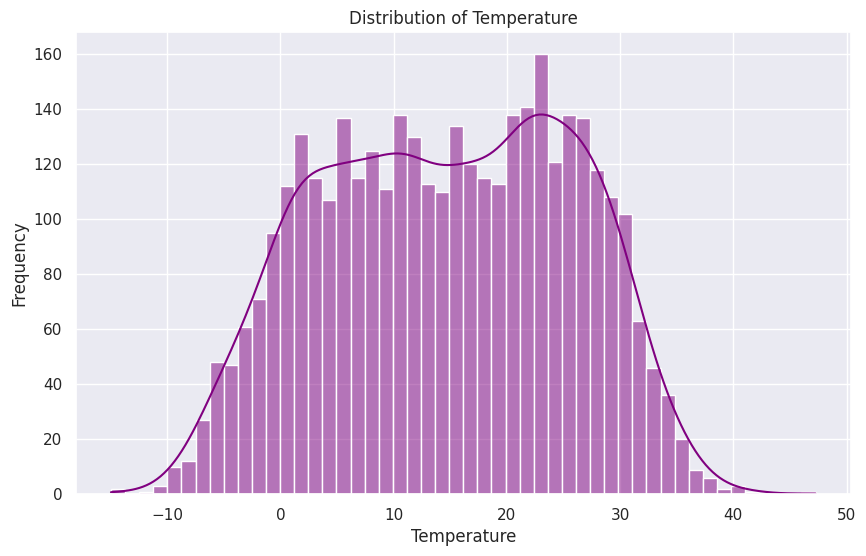

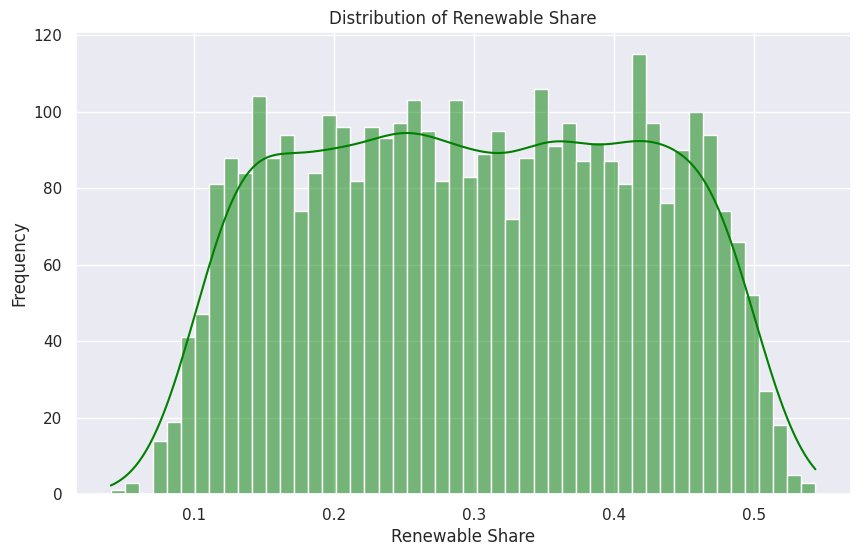


Train and Test Set Sizes:
Training set: 2922 samples
Testing set: 731 samples

ADF Statistic: -4.958127091158737
p-value: 2.6841497839557094e-05


<Figure size 1200x600 with 0 Axes>

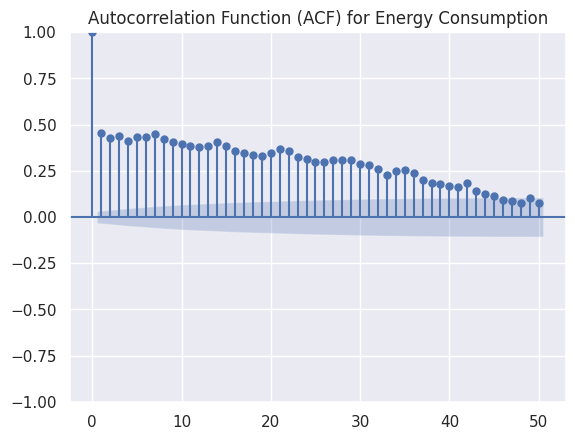

<Figure size 1200x600 with 0 Axes>

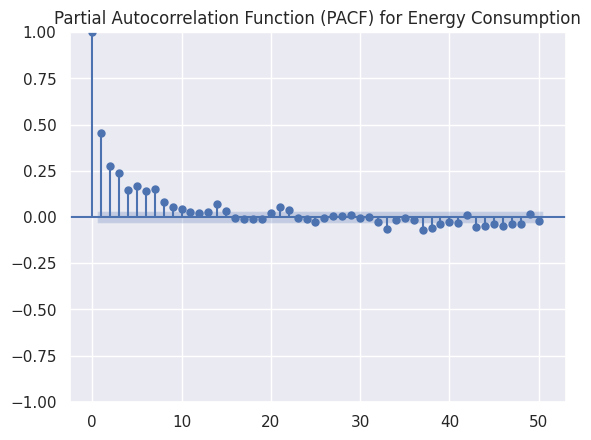


ARIMA Model Summary:

                               SARIMAX Results                                
Dep. Variable:      EnergyConsumption   No. Observations:                 3653
Model:                 ARIMA(2, 1, 2)   Log Likelihood              -19396.896
Date:                Thu, 19 Dec 2024   AIC                          38803.793
Time:                        08:45:36   BIC                          38834.808
Sample:                    01-01-2014   HQIC                         38814.838
                         - 01-01-2024                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.7107      0.164     -4.322      0.000      -1.033      -0.388
ar.L2         -0.0286      0.021     -1.336      0.182      -0.070       0.013
ma.L1         -0.1461      0.

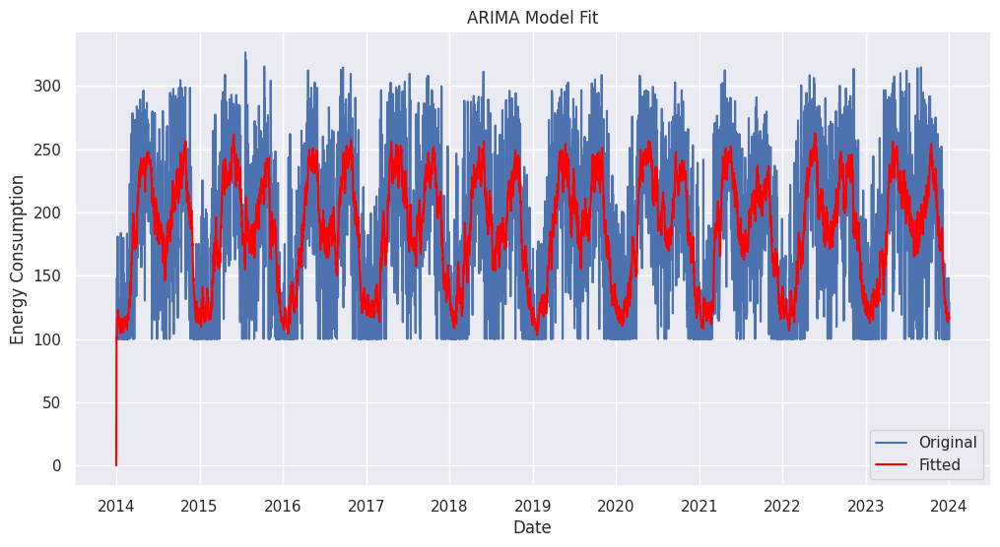


SARIMA Model Summary:

                                      SARIMAX Results                                       
Dep. Variable:                    EnergyConsumption   No. Observations:                 3653
Model:             SARIMAX(2, 1, 2)x(1, 1, [1], 12)   Log Likelihood              -19374.091
Date:                              Thu, 19 Dec 2024   AIC                          38762.182
Time:                                      08:45:54   BIC                          38805.580
Sample:                                  01-01-2014   HQIC                         38777.640
                                       - 01-01-2024                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9822      0.056    -17.577      0.000      -1.092      -0

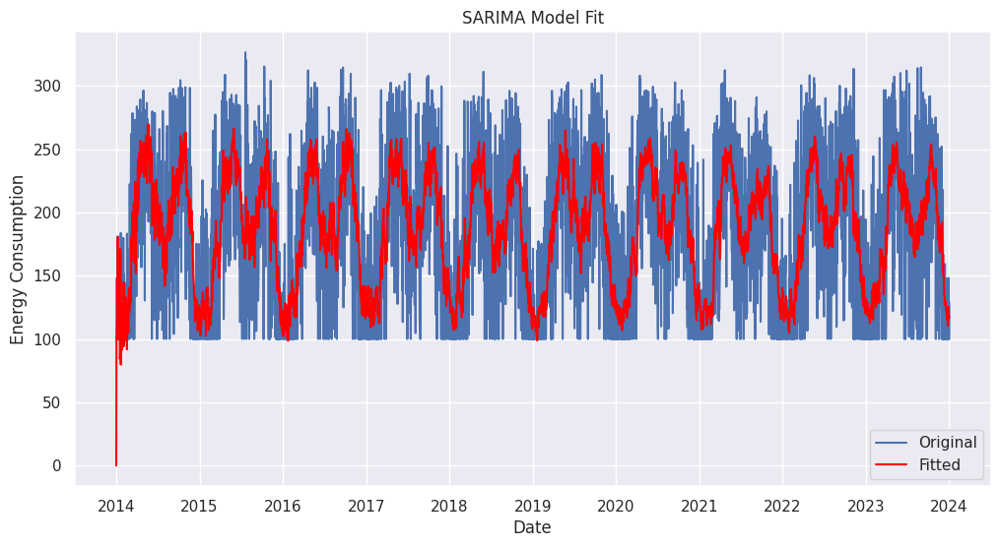

In [12]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import warnings
warnings.filterwarnings("ignore")

# Load the dataset
file_path = '/content/synthetic_energy_forecasting.csv'
data = pd.read_csv(file_path)

# Convert 'Date' to datetime format
data['Date'] = pd.to_datetime(data['Date'])

# Set the 'Date' as the index for easier plotting
data.set_index('Date', inplace=True)

# Display basic statistics
print("Basic Statistics:\n")
print(data.describe())

# Plot Energy Consumption over Time
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['EnergyConsumption'], label='Energy Consumption', color='blue')
plt.title('Energy Consumption Over Time')
plt.xlabel('Date')
plt.ylabel('Energy Consumption')
plt.legend()
plt.grid(True)
plt.show()

# Plot Energy Price over Time
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['EnergyPrice'], label='Energy Price', color='red')
plt.title('Energy Price Over Time')
plt.xlabel('Date')
plt.ylabel('Energy Price')
plt.legend()
plt.grid(True)
plt.show()

# Correlation Heatmap
plt.figure(figsize=(10, 8))
correlation = data.corr()
sns.heatmap(correlation, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

# Plot Relationship between Temperature and Energy Consumption
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Temperature', y='EnergyConsumption', data=data, hue='IsHoliday', palette='viridis')
plt.title('Temperature vs. Energy Consumption')
plt.xlabel('Temperature')
plt.ylabel('Energy Consumption')
plt.legend(title='IsHoliday', labels=['Not Holiday', 'Holiday'])
plt.grid(True)
plt.show()

# Renewable Share Trend
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['RenewableShare'], label='Renewable Share', color='green')
plt.title('Renewable Share Over Time')
plt.xlabel('Date')
plt.ylabel('Renewable Share')
plt.legend()
plt.grid(True)
plt.show()

# Group by Holiday and Non-Holiday for Energy Consumption Analysis
holiday_consumption = data.groupby('IsHoliday')['EnergyConsumption'].mean()
print("\nAverage Energy Consumption on Holidays vs Non-Holidays:\n")
print(holiday_consumption)

# Bar Plot for Energy Consumption on Holidays vs Non-Holidays
plt.figure(figsize=(8, 5))
sns.barplot(x=holiday_consumption.index, y=holiday_consumption.values, palette='muted')
plt.xticks([0, 1], ['Non-Holiday', 'Holiday'])
plt.title('Average Energy Consumption: Holidays vs Non-Holidays')
plt.ylabel('Average Energy Consumption')
plt.xlabel('')
plt.grid(True)
plt.show()

# Scatter Plot: Energy Price vs Energy Consumption
plt.figure(figsize=(10, 6))
sns.scatterplot(x='EnergyPrice', y='EnergyConsumption', data=data, hue='IsHoliday', palette='coolwarm')
plt.title('Energy Price vs Energy Consumption')
plt.xlabel('Energy Price')
plt.ylabel('Energy Consumption')
plt.legend(title='IsHoliday', labels=['Not Holiday', 'Holiday'])
plt.grid(True)
plt.show()

# Scatter Plot: Renewable Share vs Energy Consumption
plt.figure(figsize=(10, 6))
sns.scatterplot(x='RenewableShare', y='EnergyConsumption', data=data, hue='IsHoliday', palette='plasma')
plt.title('Renewable Share vs Energy Consumption')
plt.xlabel('Renewable Share')
plt.ylabel('Energy Consumption')
plt.legend(title='IsHoliday', labels=['Not Holiday', 'Holiday'])
plt.grid(True)
plt.show()

# Distribution Analysis

# Distribution of Energy Consumption
plt.figure(figsize=(10, 6))
sns.histplot(data['EnergyConsumption'], bins=50, kde=True, color='blue')
plt.title('Distribution of Energy Consumption')
plt.xlabel('Energy Consumption')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Distribution of Energy Price
plt.figure(figsize=(10, 6))
sns.histplot(data['EnergyPrice'], bins=50, kde=True, color='red')
plt.title('Distribution of Energy Price')
plt.xlabel('Energy Price')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Distribution of Temperature
plt.figure(figsize=(10, 6))
sns.histplot(data['Temperature'], bins=50, kde=True, color='purple')
plt.title('Distribution of Temperature')
plt.xlabel('Temperature')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Distribution of Renewable Share
plt.figure(figsize=(10, 6))
sns.histplot(data['RenewableShare'], bins=50, kde=True, color='green')
plt.title('Distribution of Renewable Share')
plt.xlabel('Renewable Share')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# Train-Test Split

# Define the features (X) and target (y)
X = data[['Temperature', 'EnergyPrice', 'RenewableShare', 'IsHoliday', 'DayOfWeek']]
y = data['EnergyConsumption']

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("\nTrain and Test Set Sizes:")
print(f"Training set: {X_train.shape[0]} samples")
print(f"Testing set: {X_test.shape[0]} samples")

# ARIMA Model

# Check stationarity using Augmented Dickey-Fuller Test
result = adfuller(data['EnergyConsumption'])
print("\nADF Statistic:", result[0])
print("p-value:", result[1])

# Plot ACF and PACF for Energy Consumption
plt.figure(figsize=(12, 6))
plot_acf(data['EnergyConsumption'].dropna(), lags=50)
plt.title("Autocorrelation Function (ACF) for Energy Consumption")
plt.show()

plt.figure(figsize=(12, 6))
plot_pacf(data['EnergyConsumption'].dropna(), lags=50)
plt.title("Partial Autocorrelation Function (PACF) for Energy Consumption")
plt.show()

# Fit ARIMA model (p=2, d=1, q=2)
arima_model = ARIMA(data['EnergyConsumption'], order=(2, 1, 2))
arima_result = arima_model.fit()
print("\nARIMA Model Summary:\n")
print(arima_result.summary())

# Plot ARIMA forecast
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['EnergyConsumption'], label='Original')
plt.plot(data.index, arima_result.fittedvalues, label='Fitted', color='red')
plt.title("ARIMA Model Fit")
plt.xlabel("Date")
plt.ylabel("Energy Consumption")
plt.legend()
plt.grid(True)
plt.show()

# SARIMA Model (Seasonal ARIMA)

# Fit SARIMA model (p=2, d=1, q=2) with seasonal order (P=1, D=1, Q=1, s=12)
sarima_model = SARIMAX(data['EnergyConsumption'], order=(2, 1, 2), seasonal_order=(1, 1, 1, 12))
sarima_result = sarima_model.fit()
print("\nSARIMA Model Summary:\n")
print(sarima_result.summary())

# Plot SARIMA forecast
plt.figure(figsize=(12, 6))
plt.plot(data.index, data['EnergyConsumption'], label='Original')
plt.plot(data.index, sarima_result.fittedvalues, label='Fitted', color='red')
plt.title("SARIMA Model Fit")
plt.xlabel("Date")
plt.ylabel("Energy Consumption")
plt.legend()
plt.grid(True)
plt.show()


Basic Statistics:

              Year        Month          Day    DayOfWeek    IsHoliday  \
count  3653.000000  3653.000000  3653.000000  3653.000000  3653.000000   
mean   2018.501232     6.522037    15.723789     3.000547     0.005749   
std       2.873341     3.449744     8.802698     2.000274     0.075612   
min    2014.000000     1.000000     1.000000     0.000000     0.000000   
25%    2016.000000     4.000000     8.000000     1.000000     0.000000   
50%    2019.000000     7.000000    16.000000     3.000000     0.000000   
75%    2021.000000    10.000000    23.000000     5.000000     0.000000   
max    2024.000000    12.000000    31.000000     6.000000     1.000000   

       Temperature  EnergyPrice  EnergyConsumption  RenewableShare  
count  3653.000000  3653.000000        3653.000000     3653.000000  
mean     14.599063     0.122316         185.999835        0.300366  
std      10.981373     0.010290          62.036386        0.117407  
min     -14.955680     0.089496       

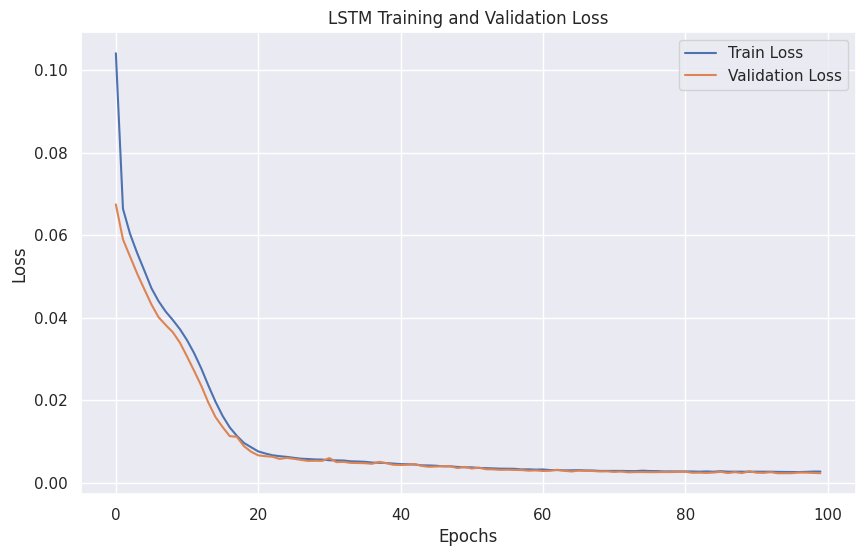

In [13]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.callbacks import EarlyStopping
import warnings
warnings.filterwarnings("ignore")

# Load the dataset
file_path = '/content/synthetic_energy_forecasting.csv'
data = pd.read_csv(file_path)

# Convert 'Date' to datetime format
data['Date'] = pd.to_datetime(data['Date'])

# Set the 'Date' as the index for easier plotting
data.set_index('Date', inplace=True)

# Display basic statistics
print("Basic Statistics:\n")
print(data.describe())

# Define the features (X) and target (y)
X = data[['Temperature', 'EnergyPrice', 'RenewableShare', 'IsHoliday', 'DayOfWeek']]
y = data['EnergyConsumption']

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("\nTrain and Test Set Sizes:")
print(f"Training set: {X_train.shape[0]} samples")
print(f"Testing set: {X_test.shape[0]} samples")

# Linear Regression
print("\n--- Linear Regression ---")
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)
lr_predictions = lr_model.predict(X_test)
lr_rmse = np.sqrt(mean_squared_error(y_test, lr_predictions))
lr_r2 = r2_score(y_test, lr_predictions)
print(f"Linear Regression RMSE: {lr_rmse:.2f}")
print(f"Linear Regression R2 Score: {lr_r2:.2f}")

# Random Forest Regressor
print("\n--- Random Forest Regressor ---")
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
rf_predictions = rf_model.predict(X_test)
rf_rmse = np.sqrt(mean_squared_error(y_test, rf_predictions))
rf_r2 = r2_score(y_test, rf_predictions)
print(f"Random Forest RMSE: {rf_rmse:.2f}")
print(f"Random Forest R2 Score: {rf_r2:.2f}")

# XGBoost Regressor
print("\n--- XGBoost Regressor ---")
xgb_model = XGBRegressor(objective='reg:squarederror', random_state=42)
xgb_model.fit(X_train, y_train)
xgb_predictions = xgb_model.predict(X_test)
xgb_rmse = np.sqrt(mean_squared_error(y_test, xgb_predictions))
xgb_r2 = r2_score(y_test, xgb_predictions)
print(f"XGBoost RMSE: {xgb_rmse:.2f}")
print(f"XGBoost R2 Score: {xgb_r2:.2f}")

# Prepare Data for LSTM
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)
y_scaled = scaler.fit_transform(y.values.reshape(-1, 1))

X_train_lstm, X_test_lstm, y_train_lstm, y_test_lstm = train_test_split(X_scaled, y_scaled, test_size=0.2, random_state=42)

# Reshape input for LSTM [samples, time steps, features]
X_train_lstm = X_train_lstm.reshape((X_train_lstm.shape[0], 1, X_train_lstm.shape[1]))
X_test_lstm = X_test_lstm.reshape((X_test_lstm.shape[0], 1, X_test_lstm.shape[1]))

# Build LSTM Model
print("\n--- LSTM Model ---")
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='relu', input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')

# Early stopping to prevent overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train LSTM Model
history = lstm_model.fit(X_train_lstm, y_train_lstm, epochs=100, batch_size=32, validation_data=(X_test_lstm, y_test_lstm), verbose=1, callbacks=[early_stopping])

# Evaluate LSTM Model
lstm_predictions = lstm_model.predict(X_test_lstm)
lstm_rmse = np.sqrt(mean_squared_error(y_test_lstm, lstm_predictions))
lstm_r2 = r2_score(y_test_lstm, lstm_predictions)
print(f"LSTM RMSE: {lstm_rmse:.2f}")
print(f"LSTM R2 Score: {lstm_r2:.2f}")

# Plot training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('LSTM Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.callbacks import EarlyStopping
import warnings
warnings.filterwarnings("ignore")

# Load the dataset
file_path = '/mnt/data/synthetic_energy_forecasting.csv'
data = pd.read_csv(file_path)

# Convert 'Date' to datetime format
data['Date'] = pd.to_datetime(data['Date'])

# Set the 'Date' as the index for easier plotting
data.set_index('Date', inplace=True)

# Display basic statistics
print("Basic Statistics:\n")
print(data.describe())

# Define the features (X) and target (y)
X = data[['Temperature', 'EnergyPrice', 'RenewableShare', 'IsHoliday', 'DayOfWeek']]
y = data['EnergyConsumption']

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("\nTrain and Test Set Sizes:")
print(f"Training set: {X_train.shape[0]} samples")
print(f"Testing set: {X_test.shape[0]} samples")

# Define evaluation metrics
def evaluate_model(y_true, y_pred, model_name):
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    r2 = r2_score(y_true, y_pred)
    print(f"\n--- {model_name} Evaluation Metrics ---")
    print(f"MAE: {mae:.2f}")
    print(f"RMSE: {rmse:.2f}")
    print(f"MAPE: {mape:.2f}%")
    print(f"R-Squared: {r2:.2f}")

# Linear Regression
print("\n--- Linear Regression ---")
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)
lr_predictions = lr_model.predict(X_test)
evaluate_model(y_test, lr_predictions, "Linear Regression")

# Random Forest Regressor
print("\n--- Random Forest Regressor ---")
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
rf_predictions = rf_model.predict(X_test)
evaluate_model(y_test, rf_predictions, "Random Forest Regressor")

# XGBoost Regressor
print("\n--- XGBoost Regressor ---")
xgb_model = XGBRegressor(objective='reg:squarederror', random_state=42)
xgb_model.fit(X_train, y_train)
xgb_predictions = xgb_model.predict(X_test)
evaluate_model(y_test, xgb_predictions, "XGBoost Regressor")

# Prepare Data for LSTM
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)
y_scaled = scaler.fit_transform(y.values.reshape(-1, 1))

X_train_lstm, X_test_lstm, y_train_lstm, y_test_lstm = train_test_split(X_scaled, y_scaled, test_size=0.2, random_state=42)

# Reshape input for LSTM [samples, time steps, features]
X_train_lstm = X_train_lstm.reshape((X_train_lstm.shape[0], 1, X_train_lstm.shape[1]))
X_test_lstm = X_test_lstm.reshape((X_test_lstm.shape[0], 1, X_test_lstm.shape[1]))

# Build LSTM Model
print("\n--- LSTM Model ---")
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='relu', input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')

# Early stopping to prevent overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train LSTM Model
history = lstm_model.fit(X_train_lstm, y_train_lstm, epochs=100, batch_size=32, validation_data=(X_test_lstm, y_test_lstm), verbose=1, callbacks=[early_stopping])

# Evaluate LSTM Model
lstm_predictions = lstm_model.predict(X_test_lstm)
evaluate_model(y_test_lstm, lstm_predictions, "LSTM")

# Plot training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('LSTM Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


Basic Statistics:

              Year        Month          Day    DayOfWeek    IsHoliday  \
count  3653.000000  3653.000000  3653.000000  3653.000000  3653.000000   
mean   2018.501232     6.522037    15.723789     3.000547     0.005749   
std       2.873341     3.449744     8.802698     2.000274     0.075612   
min    2014.000000     1.000000     1.000000     0.000000     0.000000   
25%    2016.000000     4.000000     8.000000     1.000000     0.000000   
50%    2019.000000     7.000000    16.000000     3.000000     0.000000   
75%    2021.000000    10.000000    23.000000     5.000000     0.000000   
max    2024.000000    12.000000    31.000000     6.000000     1.000000   

       Temperature  EnergyPrice  EnergyConsumption  RenewableShare  
count  3653.000000  3653.000000        3653.000000     3653.000000  
mean     14.599063     0.122316         185.999835        0.300366  
std      10.981373     0.010290          62.036386        0.117407  
min     -14.955680     0.089496       

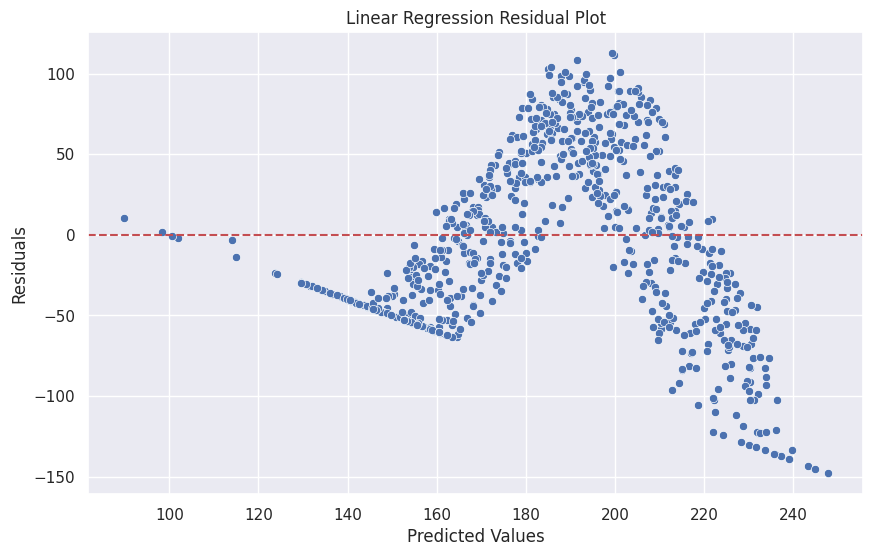

Linear Regression MAE: 46.10

--- Random Forest Regressor ---

--- Random Forest Regressor Evaluation Metrics ---
MAE: 7.30
RMSE: 9.85
MAPE: 4.01%
R-Squared: 0.97


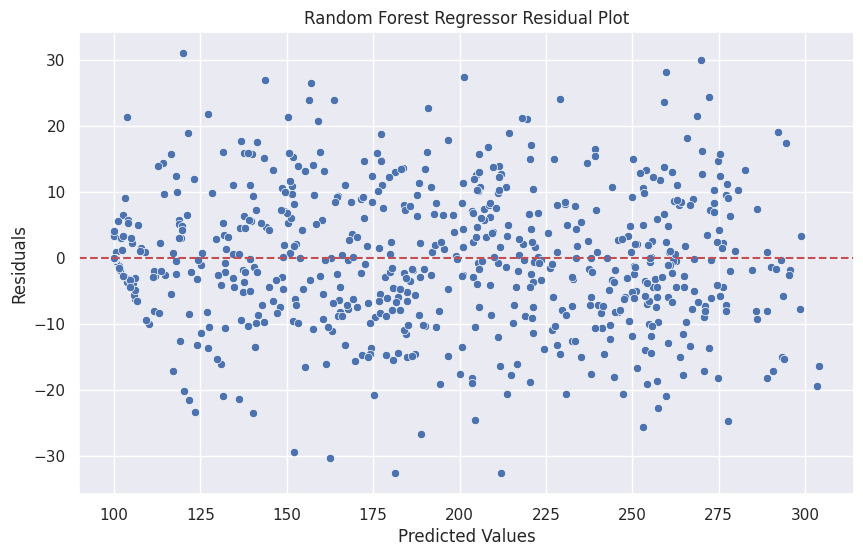

Random Forest MAE: 7.30

--- XGBoost Regressor ---

--- XGBoost Regressor Evaluation Metrics ---
MAE: 7.92
RMSE: 10.39
MAPE: 4.42%
R-Squared: 0.97


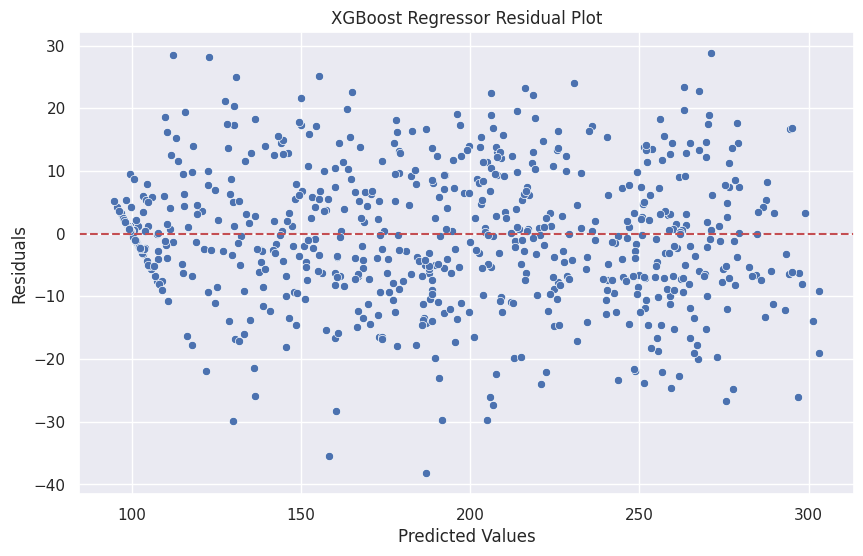

XGBoost MAE: 7.92

--- LSTM Model ---
Epoch 1/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.1503 - val_loss: 0.0653
Epoch 2/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0680 - val_loss: 0.0601
Epoch 3/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0634 - val_loss: 0.0570
Epoch 4/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0571 - val_loss: 0.0535
Epoch 5/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0555 - val_loss: 0.0487
Epoch 6/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0504 - val_loss: 0.0431
Epoch 7/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0451 - val_loss: 0.0371
Epoch 8/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0376 - val_loss: 0.0314
Epoch 9/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 0.0323 - val_loss: 0.0262
Epoch 10/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0261 - val_loss: 0.0224
Epoch 11/100
92/92 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0234 - val_loss: 0.0187
Epoch 12/100
92/92 ━━━━━

ValueError: Per-column arrays must each be 1-dimensional

<Figure size 1000x600 with 0 Axes>

In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.callbacks import EarlyStopping
import warnings
warnings.filterwarnings("ignore")

# Load the dataset
file_path = '/content/synthetic_energy_forecasting.csv'
data = pd.read_csv(file_path)

# Convert 'Date' to datetime format
data['Date'] = pd.to_datetime(data['Date'])

# Set the 'Date' as the index for easier plotting
data.set_index('Date', inplace=True)

# Display basic statistics
print("Basic Statistics:\n")
print(data.describe())

# Define the features (X) and target (y)
X = data[['Temperature', 'EnergyPrice', 'RenewableShare', 'IsHoliday', 'DayOfWeek']]
y = data['EnergyConsumption']

# Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print("\nTrain and Test Set Sizes:")
print(f"Training set: {X_train.shape[0]} samples")
print(f"Testing set: {X_test.shape[0]} samples")

# Define evaluation metrics
def evaluate_model(y_true, y_pred, model_name):
    mae = mean_absolute_error(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    r2 = r2_score(y_true, y_pred)
    print(f"\n--- {model_name} Evaluation Metrics ---")
    print(f"MAE: {mae:.2f}")
    print(f"RMSE: {rmse:.2f}")
    print(f"MAPE: {mape:.2f}%")
    print(f"R-Squared: {r2:.2f}")

    # Plot residuals
    residuals = y_true - y_pred
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=y_pred, y=residuals)
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title(f'{model_name} Residual Plot')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.grid(True)
    plt.show()

# Linear Regression
print("\n--- Linear Regression ---")
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)
lr_predictions = lr_model.predict(X_test)
evaluate_model(y_test, lr_predictions, "Linear Regression")

# Calculate Mean Absolute Error for Linear Regression
lr_mae = mean_absolute_error(y_test, lr_predictions)
print(f"Linear Regression MAE: {lr_mae:.2f}")

# Random Forest Regressor
print("\n--- Random Forest Regressor ---")
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
rf_predictions = rf_model.predict(X_test)
evaluate_model(y_test, rf_predictions, "Random Forest Regressor")

# Calculate Mean Absolute Error for Random Forest
rf_mae = mean_absolute_error(y_test, rf_predictions)
print(f"Random Forest MAE: {rf_mae:.2f}")

# XGBoost Regressor
print("\n--- XGBoost Regressor ---")
xgb_model = XGBRegressor(objective='reg:squarederror', random_state=42)
xgb_model.fit(X_train, y_train)
xgb_predictions = xgb_model.predict(X_test)
evaluate_model(y_test, xgb_predictions, "XGBoost Regressor")

# Calculate Mean Absolute Error for XGBoost
xgb_mae = mean_absolute_error(y_test, xgb_predictions)
print(f"XGBoost MAE: {xgb_mae:.2f}")

# Prepare Data for LSTM
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X_scaled = scaler.fit_transform(X)
y_scaled = scaler.fit_transform(y.values.reshape(-1, 1))

X_train_lstm, X_test_lstm, y_train_lstm, y_test_lstm = train_test_split(X_scaled, y_scaled, test_size=0.2, random_state=42)

# Reshape input for LSTM [samples, time steps, features]
X_train_lstm = X_train_lstm.reshape((X_train_lstm.shape[0], 1, X_train_lstm.shape[1]))
X_test_lstm = X_test_lstm.reshape((X_test_lstm.shape[0], 1, X_test_lstm.shape[1]))

# Build LSTM Model
print("\n--- LSTM Model ---")
lstm_model = Sequential()
lstm_model.add(LSTM(50, activation='relu', input_shape=(X_train_lstm.shape[1], X_train_lstm.shape[2])))
lstm_model.add(Dense(1))
lstm_model.compile(optimizer='adam', loss='mse')

# Early stopping to prevent overfitting
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train LSTM Model
history = lstm_model.fit(X_train_lstm, y_train_lstm, epochs=100, batch_size=32, validation_data=(X_test_lstm, y_test_lstm), verbose=1, callbacks=[early_stopping])

# Evaluate LSTM Model
lstm_predictions = lstm_model.predict(X_test_lstm)
evaluate_model(y_test_lstm, lstm_predictions, "LSTM")

# Calculate Mean Absolute Error for LSTM
lstm_mae = mean_absolute_error(y_test_lstm, lstm_predictions)
print(f"LSTM MAE: {lstm_mae:.2f}")

# Plot training and validation loss
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('LSTM Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()
